# Libraries

In [7]:
import os
os.chdir('/leonardo_scratch/fast/IscrC_DL4EO/github/water-pinns/src')  # Provide the new path here

In [2]:
from train_test.load_train import *
from train_test.load_test import *

In [ ]:
from operator import itemgetter
from tqdm import tqdm
import time
from datetime import datetime
import json

import numpy as np
import pandas as pd
import geopandas as gpd
import xarray
import rioxarray
import fionaS

#import matplotlib
import matplotlib.pyplot as plt

#from rasterio.enums import Resampling

import torch
from torch.utils.data import Dataset, DataLoader
from torch.utils.data.sampler import SequentialSampler
from torch.utils.data.sampler import RandomSampler
import torch.nn as nn
from torch.autograd import Variable

import wandb

import torchview
from torchview import draw_graph

from utils.plot import *
import importlib

In [4]:
from models.models_1d import *
from dataloaders.dataset_1d import Dataset_1D
from dataloaders import dataset_2D
from dataloaders.dataset_2d import *
from subprocess import Popen

# Load dictionary

In [8]:
json_file = "/leonardo_scratch/fast/IscrC_DL4EO/github/water-pinns/src/configs/VideoCond/ConvLSTM_VideoCond_focal_0.json" #config_files_1d/lstm_att_1.json
dict_files = {}
with open(json_file) as f:
    dict_files = json.load(f)
    print(f"Read data.json: {dict_files}")

Read data.json: {'cuda_device': 'cuda:0', 'entity': 'gsartor-unito', 'experiment_name': 'Pure_DL_2D', 'run_name': 'ConvLSTM_VideoCond_focal', 'comments': None, 'wandb_dir': '/leonardo_scratch/fast/IscrC_DL4EO/results/results_2D/logs', 'save_model_dir': '/leonardo_scratch/fast/IscrC_DL4EO/results/results_2D/models', 'dtm_nc': '/leonardo_work/IscrC_DL4EO/trials/data/dtm_ROI.nc', 'weather_nc_path': '/leonardo_work/IscrC_DL4EO/trials/data/meteo_bucket_model_snowpack_ROI_1958_2023.nc', 'weather_dtm': '/leonardo_work/IscrC_DL4EO/trials/data/dtm_ROI_arpa_weather.nc', 'wtd_csv_path': '/leonardo_work/IscrC_DL4EO/trials/data/dataset_wtd_roi.csv', 'wtd_shp': '/leonardo_work/IscrC_DL4EO/trials/data/shapefile/underground_wtd_sensor_roi.shp', 'piedmont_shp': '/leonardo_work/IscrC_DL4EO/trials/data/shapefile/piemonte_admin_boundaries.shp', 'dataset_type': '2D_VideoCond', 'piezo_head': True, 'normalization': True, 'date_max_norm': '2017-12-02', 'all_dataset': True, 'max_ds_elems': None, 'fill_value': 

# Dataset class

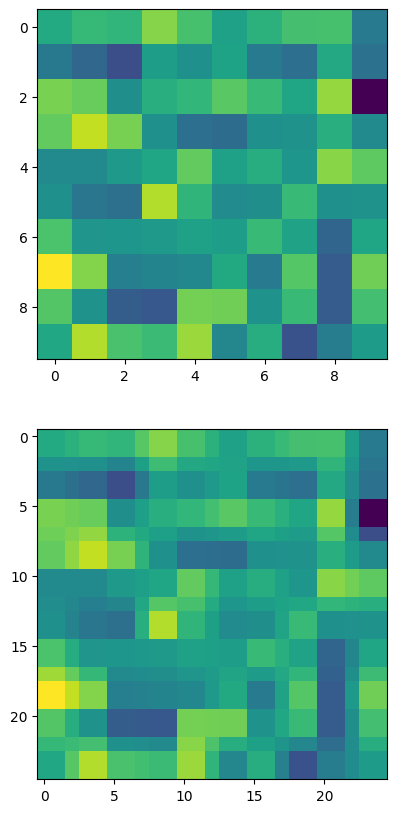

In [114]:
m = nn.AdaptiveAvgPool2d((25,25))
input = torch.randn(1, 1, 10, 10)
output = m(input)#.view(1,-1)
#print(output.size())  #torch.Size([1, 64])

fig, ax = plt.subplots(2, figsize = (10,10))
ax[0].imshow(input[0,0,:,:])
ax[1].imshow(output[0,0,:,:])
plt.show()

In [11]:
importlib.reload(dataset_2D)

<module 'dataloaders.dataset_2D' from '/leonardo_scratch/fast/IscrC_DL4EO/github/water-pinns/src/dataloaders/dataset_2D.py'>

In [9]:
ds_2D = dataset_2D.Dataset_2D_VideoCond(dict_files)

Rasterizing groundwater dataframe...
Rasterization complete!
Norm factors:
{'target_mean': np.float64(298.5490917031593), 'target_std': np.float64(74.13364400802836), 'dtm_mean': <xarray.DataArray '__xarray_dataarray_variable__' ()> Size: 4B
array(1139.4907, dtype=float32)
Coordinates:
    spatial_ref  int64 8B 0, 'dtm_std': <xarray.DataArray '__xarray_dataarray_variable__' ()> Size: 4B
array(884.7991, dtype=float32)
Coordinates:
    spatial_ref  int64 8B 0, 'lat_mean': <xarray.DataArray 'y' ()> Size: 8B
array(44.79349462)
Coordinates:
    spatial_ref  int64 8B 0, 'lat_std': <xarray.DataArray 'y' ()> Size: 8B
array(0.27434982)
Coordinates:
    spatial_ref  int64 8B 0, 'lon_mean': <xarray.DataArray 'x' ()> Size: 8B
array(7.3321)
Coordinates:
    spatial_ref  int64 8B 0, 'lon_std': <xarray.DataArray 'x' ()> Size: 8B
array(0.40622853)
Coordinates:
    spatial_ref  int64 8B 0, 'weather_mean': <xarray.Dataset> Size: 64B
Dimensions:      ()
Coordinates:
    spatial_ref  int64 8B 0
Data varia

In [7]:
ds_2D.wtd_data_raserized

<xarray.Dataset> Size: 188MB
Dimensions:      (y: 40, x: 62, time: 8400)
Coordinates:
  * y            (y) float64 320B 45.25 45.22 45.2 45.18 ... 44.38 44.36 44.33
  * x            (x) float64 496B 6.64 6.662 6.685 6.708 ... 7.979 8.002 8.024
  * time         (time) datetime64[ns] 67kB 2001-01-01 2001-01-02 ... 2023-12-31
    spatial_ref  int64 8B 0
Data variables:
    h            (time, y, x) float64 167MB nan nan nan nan ... nan nan nan nan
    mask         (time, y, x) bool 21MB False False False ... False False False

In [7]:
ds_2D.wtd_df

wtd       lon       lat    height  nan_mask  \
date       sensor_id                                                        
2001-01-01 00405910001   1.800000  0.613639 -0.353667 -0.965821      True   
           00408910001   3.981667  0.813198 -0.759672 -0.886174      True   
           00407810001  39.876667  0.374769 -1.221921 -0.702913      True   
           00105910001        NaN  0.807151  0.148287 -1.018794     False   
           00112710001        NaN  0.689774  0.464772 -1.034881     False   
...                           ...       ...       ...       ...       ...   
2023-12-31 00105110001   3.553333  0.517267  0.444808 -1.021212      True   
           00404110001        NaN  0.833452 -0.080484 -0.998107     False   
           00121510001  14.500000  1.203523  0.596678 -0.974594      True   
           00104810001   2.056667  0.915711  0.472337 -1.014218      True   
           00127210005        NaN  0.667861  0.655431 -1.026275     False   

                               h  
date       sensor_id              
2001-01-01 00405910001 -0.207732  
           00408910001  0.714166  
           00407810001  2.418561  
           00105910001       NaN  
           00112710001       NaN  
...                          ...  
2023-12-31 00105110001 -0.893013  
           00404110001       NaN  
           00121510001 -0.483960  
           00104810001 -0.789269  
           00127210005       NaN  

[260400 rows x 6 columns]

In [18]:
import copy

In [33]:
ds_2D.dtm_roi

<xarray.DataArray '__xarray_dataarray_variable__' (band: 1, y: 1146, x: 1684)> Size: 8MB
array([[[3165.9429 , 3190.0159 , ...,  202.6952 ,  202.38902],
        [3127.6099 , 3133.189  , ...,  202.07877,  202.08029],
        ...,
        [1861.1785 , 1851.5795 , ...,  725.16925,  706.9846 ],
        [1906.2725 , 1897.0889 , ...,  754.2417 ,  743.1294 ]]], dtype=float32)
Coordinates:
  * band         (band) int64 8B 1
  * x            (x) float64 13kB 6.627 6.627 6.628 6.629 ... 8.027 8.028 8.029
  * y            (y) float64 9kB 45.27 45.26 45.26 45.26 ... 44.31 44.31 44.31
    spatial_ref  int64 8B 0
Attributes:
    NETCDF_DIM_EXTRA:  {band}
    AREA_OR_POINT:     Area
    scale_factor:      1.0
    add_offset:        0.0
    NETCDF_DIM_band:   1
    _FillValue:        nan

In [66]:
(1146*90)/2000

51.57

In [24]:
int(1146*0.037)

42

In [25]:
int(1684*0.037)

62

In [22]:
42/1146

0.03664921465968586

In [69]:
1684*0.0436

73.4224

In [103]:
42/3

14.0

In [28]:
dtm_roi_downsampled = ds_2D.dtm_roi.rio.reproject(
            ds_2D.dtm_roi.rio.crs,
            shape=(42, 62),
            resampling=Resampling.bilinear,
        )

wtd_df_util = copy.deepcopy(ds_2D.wtd_df)
wtd_df_util["date"] = ds_2D.wtd_df.index.get_level_values(0)
wtd_data_geop = gpd.GeoDataFrame(
wtd_df_util, geometry =gpd.points_from_xy(wtd_df_util["lon"], 
                                    wtd_df_util["lat"]), crs="EPSG:4326")
wtd_data_geop = wtd_data_geop[["date",ds_2D.target,"geometry"]]

minx = dtm_roi_downsampled.x.min()
miny = dtm_roi_downsampled.y.min()
maxx = dtm_roi_downsampled.x.max()
maxy = dtm_roi_downsampled.y.max()

print("Rasterizing groundwater dataframe...")
rasterized_ds_list = []
    
vector_ds = wtd_data_geop.loc[wtd_data_geop["date"] == ds_2D.dates[0],:]

rasterized_ds = make_geocube(vector_data=vector_ds,
                                measurements=[ds_2D.target],
                                output_crs="epsg:4326",
                                # resolution= new_resolution,
                                resolution=(dtm_roi_downsampled.rio.transform().a, round(dtm_roi_downsampled.rio.transform().e, 4)),
                                # Global extent in degrees of longitude and latitude
                                geom=box(minx=minx, miny=miny, maxx=maxx, maxy=maxy))
    
rasterized_ds_list.append(rasterized_ds)
    
wtd_data_raserized = xarray.concat(rasterized_ds_list, dim = "time")

Rasterizing groundwater dataframe...


In [29]:
wtd_data_raserized

<xarray.Dataset> Size: 22kB
Dimensions:      (time: 1, y: 42, x: 62)
Coordinates:
  * y            (y) float64 336B 44.33 44.35 44.37 44.4 ... 45.21 45.23 45.26
  * x            (x) float64 496B 8.024 8.002 7.979 7.956 ... 6.685 6.662 6.64
    spatial_ref  int64 8B 0
Dimensions without coordinates: time
Data variables:
    h            (time, y, x) float64 21kB nan nan nan nan ... nan nan nan nan

In [55]:
weather_xr = ds_2D.weather_xr.rio.reproject("EPSG:32632")

In [56]:
weather_xr

<xarray.Dataset> Size: 162MB
Dimensions:      (x: 11, y: 11, time: 23864)
Coordinates:
  * x            (x) float64 88B 3.162e+05 3.277e+05 ... 4.196e+05 4.311e+05
  * y            (y) float64 88B 5.022e+06 5.01e+06 ... 4.918e+06 4.907e+06
  * time         (time) datetime64[ns] 191kB 1958-08-31 ... 2023-12-31
    spatial_ref  int64 8B 0
Data variables:
    prec         (time, y, x) float32 12MB 0.269 0.264 0.223 ... 0.0 0.4453 nan
    tmax         (time, y, x) float32 12MB 15.8 16.47 15.34 ... 2.019 4.981 nan
    tmin         (time, y, x) float32 12MB 9.772 9.973 9.613 ... 1.353 nan
    tmean        (time, y, x) float32 12MB 12.79 13.22 12.48 ... 0.759 3.167 nan
    prain        (time, y, x) float32 12MB 0.269 0.264 0.223 ... 0.0 0.3287 nan
    psnow        (time, y, x) float32 12MB 0.0 0.0 0.0 0.0 ... 0.0 0.1166 nan
    et_0         (time, y, x) float64 23MB 5.485 5.771 5.289 ... 1.021 nan
    r_a          (time, y, x) float64 23MB 31.75 31.75 31.75 ... 11.12 11.12 nan
    snowpack     (time, y, x) float64 23MB 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 nan
    snowmelt     (time, y, x) float64 23MB 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 nan
Attributes:
    CDI:          Climate Data Interface version 2.1.1 (https://mpimet.mpg.de...
    Conventions:  CF-1.6
    history:      Tue May 14 07:41:14 2024: cdo -r settaxis,1957-12-01,12:00,...
    CDO:          Climate Data Operators version 2.1.1 (https://mpimet.mpg.de...

In [63]:
weather_xr.y.values[5] - weather_xr.y.values[4]

np.float64(-11488.24362590909)

In [64]:
spatial_resolution_meteo =  geopy.distance.geodesic((ds_2D.weather_xr.lat.values[4],
                               ds_2D.weather_xr.lon.values[0]),
                               (ds_2D.weather_xr.lat.values[5],
                                ds_2D.weather_xr.lon.values[0])).km
print("Y - Resolution in km: ", round(spatial_resolution_meteo, 5))

Y - Resolution in km:  13.89086


In [100]:
import geopy.distance

spatial_resolution_meteo =  geopy.distance.geodesic((wtd_data_raserized.y.values[0],
                               wtd_data_raserized.x.values[0]),
                               (wtd_data_raserized.y.values[1],
                                wtd_data_raserized.x.values[0])).km
print("Y - Resolution in km: ", round(spatial_resolution_meteo, 5))

Y - Resolution in km:  2.59895


In [101]:
spatial_resolution_meteo =  geopy.distance.geodesic((wtd_data_raserized.y.values[0],
                               wtd_data_raserized.x.values[0]),
                               (wtd_data_raserized.y.values[0],
                                wtd_data_raserized.x.values[1])).km
print("X - Resolution in km: ", round(spatial_resolution_meteo, 5))

X - Resolution in km:  1.81045


In [ ]:
# [X, Z, W, Y, X_mask, Y_mask]

In [91]:
ds_2D[0][2][0].shape

torch.Size([10, 30, 9, 12])

In [10]:
ds_2D[-1][0]

tensor([[ 44.6989,   7.6403, 284.9330,   0.0000],
        [ 44.5678,   7.7264, 355.4048,   0.0000],
        [ 44.4186,   7.5372, 517.5540,   0.0000],
        [ 44.8609,   7.7238, 238.0624, 231.0007],
        [ 44.9630,   7.6731, 223.8288,   0.0000],
        [ 44.8894,   7.4948, 259.0813,   0.0000],
        [ 44.7727,   7.6879, 257.1220,   0.0000],
        [ 44.5182,   7.5323, 451.7833, 425.9136],
        [ 45.0510,   7.6556, 250.0360, 227.4857],
        [ 44.8298,   7.3085, 372.4169, 347.0769],
        [ 44.7312,   7.3395, 331.8638, 321.3172],
        [ 44.5084,   7.4898, 489.2412,   0.0000],
        [ 44.6460,   7.6524, 316.6961, 312.7694],
        [ 44.9254,   7.8477, 238.7121,   0.0000],
        [ 44.6888,   7.8457, 278.9606, 274.7940],
        [ 44.5701,   7.5750, 384.9848, 379.9648],
        [ 44.8879,   7.6868, 229.7140, 223.4940],
        [ 44.7668,   7.5293, 251.4633,   0.0000],
        [ 45.0939,   7.5747, 291.6503, 264.0036],
        [ 45.0782,   7.7187, 216.4133, 208.3670],


In [11]:
ds_2D[0][2][0].shape

torch.Size([10, 30, 9, 12])

In [84]:
ds_2D[0][3].size()[:2]

torch.Size([30, 104])

In [86]:
ds_2D[0][3].shape

torch.Size([30, 104, 150])

In [16]:
ds_2D[0][1]

tensor([[[  45.2650,    6.6267, 3165.9429],
         [  45.2650,    6.6275, 3190.0159],
         [  45.2650,    6.6283, 3177.3804],
         ...,
         [  45.2650,    8.0275,  202.9900],
         [  45.2650,    8.0283,  202.6952],
         [  45.2650,    8.0292,  202.3890]],

        [[  45.2642,    6.6267, 3127.6099],
         [  45.2642,    6.6275, 3133.1890],
         [  45.2642,    6.6283, 3113.8977],
         ...,
         [  45.2642,    8.0275,  202.1493],
         [  45.2642,    8.0283,  202.0788],
         [  45.2642,    8.0292,  202.0803]],

        [[  45.2633,    6.6267, 3061.9373],
         [  45.2633,    6.6275, 3047.0769],
         [  45.2633,    6.6283, 3050.0615],
         ...,
         [  45.2633,    8.0275,  201.7929],
         [  45.2633,    8.0283,  202.2607],
         [  45.2633,    8.0292,  202.2041]],

        ...,

        [[  44.3125,    6.6267, 1782.0723],
         [  44.3125,    6.6275, 1783.2568],
         [  44.3125,    6.6283, 1794.7913],
         ...,


In [13]:
ds.wtd_df

NameError: name 'ds' is not defined

In [12]:
ds_2D[0][1][0][None,:,:].shape

torch.Size([1, 150, 3])

In [14]:
ds_2D[0][1].shape

torch.Size([104, 150, 3])

In [7]:
ds_2D[0][0].shape

torch.Size([15, 31, 4])

In [8]:
ds_2D[0][-2].shape

torch.Size([15, 31])

# Dataloader

In [7]:
from dataloaders import load_dataset

In [46]:
importlib.reload(load_dataset)

ImportError: cannot import name 'Dataset_2D_ImageCond' from 'dataloaders.dataset_2D' (/leonardo_scratch/fast/IscrC_DL4EO/github/water-pinns/src/dataloaders/dataset_2D.py)

In [8]:
dataset = load_dataset.load_dataset(dict_files)

AttributeError: 'Dataset_2D_VideoCond' object has no attribute 'wtd_data_raserized'

In [ ]:
train_loader, test_loader = load_dataset.get_dataloader(dataset, dict_files)

Traing size: 6178 - Start: 2001-01-01 - End: 2017-12-01;
Test size: 2207 - Start: 2017-12-16 - End: 2023-12-16


In [52]:
start_date = np.datetime64("2001-01-01")
end_date = np.datetime64("2001-01-03")
dataset.wtd_df[["h"]].loc[pd.IndexSlice[start_date:end_date, :]]

h
date       sensor_id            
2001-01-01 00405910001 -0.207950
           00408910001  0.713226
           00407810001  2.416287
           00105910001       NaN
           00112710001       NaN
...                          ...
2001-01-03 00105110001       NaN
           00404110001       NaN
           00121510001       NaN
           00104810001       NaN
           00127210005       NaN

[93 rows x 1 columns]

In [55]:
dataset.wtd_df[["h"]].loc[pd.IndexSlice[start_date:end_date, :]].values.reshape((3, len(dataset.sensor_id_list)))

array([[-0.20795023,  0.71322579,  2.41628749,         nan,         nan,
                nan,         nan,         nan,         nan,         nan,
                nan,         nan,         nan,         nan,         nan,
                nan,         nan,         nan,         nan,         nan,
                nan,         nan,         nan,         nan,         nan,
                nan,         nan,         nan,         nan,         nan,
                nan],
       [        nan,  0.71340565,  2.41635494,         nan,         nan,
                nan,         nan,         nan,         nan,         nan,
                nan,         nan,         nan,         nan,         nan,
                nan,         nan,         nan,         nan,         nan,
                nan,         nan,         nan,         nan,         nan,
                nan,         nan,         nan,         nan,         nan,
                nan],
       [        nan,  0.71331572,  2.41622005,         nan,         nan,
       

In [ ]:
train_idx = int(dataset.get_iloc_from_date(date_max = np.datetime64(dict_files["test_split_p"])))
test_idx = int(dataset.__len__() - train_idx)

train_idxs, test_idxs = np.arange(train_idx + 1), np.arange(train_idx + dict_files["twindow"],
                                                            train_idx + test_idx)

In [ ]:
test_idxs

array([6208, 6209, 6210, ..., 8367, 8368, 8369])

In [ ]:
dataset.__len__()

8370

In [7]:
torch.tensor([0])/torch.tensor([0 + 1e-5])

tensor([0.])

In [ ]:
dataset.wtd_data_raserized.time.values[8369].astype('datetime64[D]')

np.datetime64('2023-12-01')

In [ ]:
dataset[test_idxs[-1]][2][0].shape

torch.Size([10, 30, 9, 12])

In [ ]:
dataset[test_idxs[-1] + 1][2][0].shape

torch.Size([10, 29, 9, 12])

In [30]:
# for date in dataset.wtd_data_raserized.time:
#     test = (~dataset.wtd_data_raserized["mask"].sel(time = date)).all().values
#     if test == True:
#         print(date)
#         break
    
# print("all at least with 1 value")

for date in dataset.wtd_data_raserized.time:
    test = dataset.wtd_data_raserized["h"].sel(time = date).isnull().all().values
    if test == True:
        print(date)
        break
    
print("all at least with 1 value")

all at least with 1 value


In [39]:
dataset.wtd_data_raserized["mask"].isnull().any()

<xarray.DataArray 'mask' ()> Size: 1B
array(False)
Coordinates:
    spatial_ref  int64 8B 0

In [14]:
import copy

In [26]:
int(5*0.25)

1

In [7]:
dtm_roi = rioxarray.open_rasterio(dict_files["dtm_nc"],
                                               engine='fiona')
dtm_roi = dtm_roi.rio.write_crs("epsg:4326")

In [ ]:
dtm_roi_downsampled = dtm_roi.rio.reproject(
            dtm_roi.rio.crs,
            shape=(50, 50),
            resampling=Resampling.bilinear,
        )

wtd_df_util = copy.deepcopy(dataset.wtd_df)
wtd_df_util["date"] = dataset.wtd_df.index.get_level_values(0)
wtd_data_geop = gpd.GeoDataFrame(
wtd_df_util, geometry =gpd.points_from_xy(wtd_df_util["lon"], 
                                    wtd_df_util["lat"]), crs="EPSG:4326")
wtd_data_geop = wtd_data_geop[["date",dataset.target,"geometry"]]

minx = dtm_roi_downsampled.x.min()
miny = dtm_roi_downsampled.y.min()
maxx = dtm_roi_downsampled.x.max()
maxy = dtm_roi_downsampled.y.max()

print("Rasterizing groundwater dataframe...")
rasterized_ds_list = []
    
vector_ds = wtd_data_geop.loc[wtd_data_geop["date"] == dataset.dates[0],:]

rasterized_ds = make_geocube(vector_data=vector_ds,
                                measurements=[dataset.target],
                                output_crs="epsg:4326",
                                # resolution= new_resolution,
                                resolution=(dtm_roi_downsampled.rio.transform().a, round(dtm_roi_downsampled.rio.transform().e, 4)),
                                # Global extent in degrees of longitude and latitude
                                geom=box(minx=minx, miny=miny, maxx=maxx, maxy=maxy))
    
rasterized_ds_list.append(rasterized_ds)
    
wtd_data_raserized = xarray.concat(rasterized_ds_list, dim = "time")

Rasterizing groundwater dataframe...


: 

In [11]:
dtm_roi_downsampled

<xarray.DataArray '__xarray_dataarray_variable__' (band: 1, y: 50, x: 50)> Size: 10kB
array([[[ 1.618557  ,  1.641376  ,  1.7222459 , ..., -1.0520878 ,
         -1.0670751 , -1.061788  ],
        [ 1.2368053 ,  1.2375658 ,  1.3316774 , ..., -1.0583372 ,
         -1.0765316 , -1.0771246 ],
        [ 0.7786895 ,  0.5480234 ,  0.37086177, ..., -1.0711344 ,
         -1.0797756 , -1.0904813 ],
        ...,
        [ 0.4497974 ,  0.6361017 ,  0.6680943 , ..., -0.64772546,
         -0.6738349 , -0.625073  ],
        [ 0.9163245 ,  1.1539553 ,  1.106658  , ..., -0.5617134 ,
         -0.5380528 , -0.44397664],
        [ 0.71709144,  0.77946836,  0.88310325, ..., -0.4060324 ,
         -0.503575  , -0.3779997 ]]], dtype=float32)
Coordinates:
  * x            (x) float64 400B 6.64 6.668 6.696 6.724 ... 7.959 7.987 8.016
  * y            (y) float64 400B 45.26 45.24 45.22 45.2 ... 44.36 44.34 44.32
  * band         (band) int64 8B 1
    spatial_ref  int64 8B 0
Attributes:
    _FillValue:  nan

In [23]:
prova_mask = copy.deepcopy(dataset[0][-2])
prova_mask.shape

torch.Size([31])

In [24]:
dataset[0][-2].nonzero().shape

torch.Size([3, 1])

In [22]:
prova_mask[dataset[0][-2].nonzero().squeeze()]

tensor([True, True, True])

In [5]:
torch.randint(0,5,[2])

tensor([4, 0])

# Model 

In [10]:
from models import models_2D

In [44]:
importlib.reload(models_2D)

<module 'models.models_2D' from '/leonardo_scratch/fast/IscrC_DL4EO/github/water-pinns/src/models/models_2D.py'>

In [ ]:
# model = models_2D.AttCB_ConvLSTM(
#                 weather_CHW_dim = dict_files["weather_CHW_dim"],
#                 cb_emb_dim = dict_files["cb_emb_dim"],
#                 cb_heads = dict_files["cb_heads"],
#                 channels_cb_wb = dict_files["channels_cb_wb"],
#                 convlstm_input_units = dict_files["convlstm_input_units"],
#                 convlstm_units = dict_files["convlstm_units"],
#                 convlstm_kernel = dict_files["convlstm_kernel"],
#                 densification_dropout = dict_files["densification_dropout"],
#                 upsampling_dim = [104, 150])

In [38]:
print("Total number of trainable parameters: " ,sum(p.numel() for p in model.parameters() if p.requires_grad))

Total number of trainable parameters:  733593


In [16]:
print("Total number of trainable parameters: " ,sum(p.numel() for p in model.parameters() if p.requires_grad))

Total number of trainable parameters:  5078809


In [26]:
print("Total number of trainable parameters: " ,sum(p.numel() for p in model.parameters() if p.requires_grad))

Total number of trainable parameters:  9424025


In [45]:
model = models_2D.VideoCB_ConvLSTM(
                weather_CHW_dim = dict_files["weather_CHW_dim"],
                cb_emb_dim = dict_files["cb_emb_dim"],
                cb_heads = dict_files["cb_heads"],
                channels_cb_wb = dict_files["channels_cb_wb"],
                convlstm_input_units = dict_files["convlstm_input_units"],
                convlstm_units = dict_files["convlstm_units"],
                convlstm_kernel = dict_files["convlstm_kernel"],
                densification_dropout = dict_files["densification_dropout"],
                upsampling_dim = [42, 62])

In [37]:
ds_2D[0][0][0,:,:][None,None,:,:].shape

torch.Size([1, 1, 31, 4])

In [16]:
ds_2D[0][-3].unsqueeze(0).shape

torch.Size([1, 15, 42, 62])

In [32]:
model.train()
prova_out = model(ds_2D[0][0].unsqueeze(0),
                       ds_2D[0][1].unsqueeze(0),
                       [ds_2D[0][2][0].unsqueeze(0),
                        ds_2D[0][2][1].unsqueeze(0)],
                       ds_2D[0][-2].unsqueeze(0),
                       teacher_forcing = True)

In [33]:
prova_out.shape

torch.Size([15, 42, 62])

In [12]:
prova_out.shape

torch.Size([15, 40, 62])

In [33]:
dataset[0][1].shape

torch.Size([104, 150, 3])

In [32]:
dataset[0][-2].shape

torch.Size([15, 31])

In [46]:
prova_out_eval = model(ds_2D[0][0][0,:,:].unsqueeze(0),
                       ds_2D[0][1].unsqueeze(0),
                       [ds_2D[0][2][0].unsqueeze(0),
                        ds_2D[0][2][1].unsqueeze(0)],
                       ds_2D[0][-2][0,:].unsqueeze(0),
                       teacher_forcing = False)

torch.Size([1, 1, 42, 62, 1])
torch.Size([1, 42, 62, 4])
torch.Size([1, 1, 42, 62, 1])
torch.Size([1, 42, 62, 4])
torch.Size([1, 1, 42, 62, 1])
torch.Size([1, 42, 62, 4])
torch.Size([1, 1, 42, 62, 1])
torch.Size([1, 42, 62, 4])
torch.Size([1, 1, 42, 62, 1])
torch.Size([1, 42, 62, 4])
torch.Size([1, 1, 42, 62, 1])
torch.Size([1, 42, 62, 4])
torch.Size([1, 1, 42, 62, 1])
torch.Size([1, 42, 62, 4])
torch.Size([1, 1, 42, 62, 1])
torch.Size([1, 42, 62, 4])
torch.Size([1, 1, 42, 62, 1])
torch.Size([1, 42, 62, 4])
torch.Size([1, 1, 42, 62, 1])
torch.Size([1, 42, 62, 4])
torch.Size([1, 1, 42, 62, 1])
torch.Size([1, 42, 62, 4])
torch.Size([1, 1, 42, 62, 1])
torch.Size([1, 42, 62, 4])
torch.Size([1, 1, 42, 62, 1])
torch.Size([1, 42, 62, 4])
torch.Size([1, 1, 42, 62, 1])
torch.Size([1, 42, 62, 4])
torch.Size([1, 1, 42, 62, 1])
torch.Size([1, 42, 62, 4])


In [47]:
prova_out_eval.shape

torch.Size([15, 42, 62])

In [10]:
from torch import autograd

In [15]:
a = True
b = False
if a is True and b is True:
    print("w")

In [21]:
torch.rand(1).item()

0.6271659731864929

In [27]:
ds_2D[0][-1][-2].shape

torch.Size([104, 150])

In [34]:
ds_2D[0][-3][-2][ds_2D[0][-1][-2]]

tensor([-1.0693, -0.5485, -0.8956, -0.6132,  0.7149,  1.7582,  2.4142])

In [32]:
ds_2D[0][0][-1,:,-1]

tensor([ 0.0000,  0.7149,  2.4142, -0.8956, -1.0693, -0.5485, -0.6132,  1.7582,
         0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
         0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
         0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000])

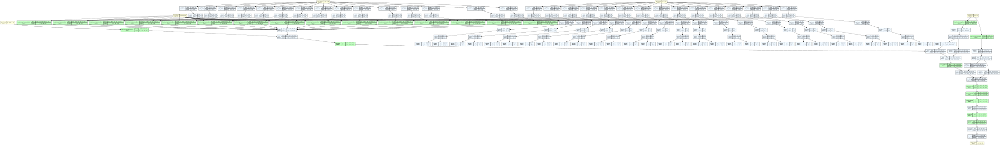

In [10]:
draw_graph(model,
            input_data=(ds_2D[0][0].unsqueeze(0),
                        ds_2D[0][1].unsqueeze(0),
                        [ds_2D[0][2][0].unsqueeze(0),
                            ds_2D[0][2][1].unsqueeze(0)],
                        ds_2D[0][-2].unsqueeze(0),
                        True),
            depth = 1,
            mode = "train",
            device=ds_2D[0][0].device).visual_graph

In [65]:
dataset[0][0].unsqueeze(0)

tensor([[[-3.1674e-01,  7.7451e-01, -9.6582e-01, -2.0795e-01],
         [-7.8952e-01,  9.8835e-01, -8.8617e-01,  7.1323e-01],
         [-1.3278e+00,  5.1855e-01, -7.0291e-01,  2.4163e+00],
         [ 2.6776e-01,  9.8187e-01, -1.0188e+00,  0.0000e+00],
         [ 6.3630e-01,  8.5609e-01, -1.0349e+00,  0.0000e+00],
         [ 3.7089e-01,  4.1321e-01, -9.9504e-01,  0.0000e+00],
         [-5.0476e-02,  8.9283e-01, -9.9725e-01,  0.0000e+00],
         [-9.6861e-01,  5.0627e-01, -7.7725e-01,  0.0000e+00],
         [ 9.5378e-01,  8.1241e-01, -1.0053e+00,  0.0000e+00],
         [ 1.5585e-01, -4.9410e-02, -8.6695e-01,  0.0000e+00],
         [-2.0010e-01,  2.7518e-02, -9.1278e-01,  0.0000e+00],
         [-1.0038e+00,  4.0085e-01, -7.3491e-01,  0.0000e+00],
         [-5.0760e-01,  8.0464e-01, -9.2992e-01,  0.0000e+00],
         [ 5.0078e-01,  1.2897e+00, -1.0181e+00,  0.0000e+00],
         [-3.5295e-01,  1.2847e+00, -9.7257e-01,  0.0000e+00],
         [-7.8123e-01,  6.1246e-01, -8.5274e-01,  0.000

In [66]:
dataset[0][3].shape

torch.Size([15, 104, 150])

In [70]:
 #[X, Z, W, Y, X_mask, Y_mask]
model.train()
prova_out = model(X = dataset[0][0].unsqueeze(0),
      Z = dataset[0][1].unsqueeze(0),
      W = [dataset[0][2][0].unsqueeze(0),
           dataset[0][2][1].unsqueeze(0)],
      X_mask = dataset[0][-2].unsqueeze(0))

In [21]:
prova_out = model(X = torch.concat([dataset[0][0].unsqueeze(0),
                                    dataset[1][0].unsqueeze(0)], dim = 0),
      Z = torch.concat([dataset[0][1].unsqueeze(0),
                        dataset[1][1].unsqueeze(0)], dim = 0),
      W = [torch.concat([dataset[0][2][0].unsqueeze(0),
                         dataset[1][2][0].unsqueeze(0)], dim = 0),
           torch.concat([dataset[0][2][1].unsqueeze(0),
                         dataset[1][2][1].unsqueeze(0)], dim = 0)],
      X_mask = torch.concat([dataset[0][-2].unsqueeze(0),
                             dataset[1][-2].unsqueeze(0)], dim = 0))

: 

In [1]:
dataset[0][-1].shape

NameError: name 'dataset' is not defined

In [31]:
importlib.reload(models_2D)

<module 'models.models_2D' from '/leonardo_scratch/fast/IscrC_DL4EO/github/water-pinns/src/models/models_2D.py'>

In [12]:
input_prova = torch.tensor([[[0,1],
                              [0,1],
                              [0,1]],
                            [[0,1],
                              [0,1],
                              [0,1]],
                            [[0,1],
                              [0,1],
                              [0,1]]]).to(torch.float16)
print(input_prova.shape)

torch.Size([3, 3, 2])


In [25]:
md =  partial(torch.moveaxis, source = -1, destination = -2)

In [29]:
ln_base = nn.LayerNorm((3,2))

In [30]:
ln_base._parameters

{'weight': Parameter containing:
 tensor([[1., 1.],
         [1., 1.],
         [1., 1.]], requires_grad=True),
 'bias': Parameter containing:
 tensor([[0., 0.],
         [0., 0.],
         [0., 0.]], requires_grad=True)}

In [29]:
torch.mean(input_prova, dim = -1)

tensor([[0.5000, 0.5000, 0.5000],
        [0.5000, 0.5000, 0.5000],
        [0.5000, 0.5000, 0.5000]], dtype=torch.float16)

In [40]:
(input_prova - torch.mean(input_prova, dim = -1).unsqueeze(-1))/torch.sqrt(1e-05 + torch.var(input_prova, dim = -1, unbiased=False).unsqueeze(-1))

tensor([[[-1.,  1.],
         [-1.,  1.],
         [-1.,  1.]],

        [[-1.,  1.],
         [-1.,  1.],
         [-1.,  1.]],

        [[-1.,  1.],
         [-1.,  1.],
         [-1.,  1.]]], dtype=torch.float16)

In [33]:
ln_base(input_prova)

tensor([[[-1.,  1.],
         [-1.,  1.],
         [-1.,  1.]],

        [[-1.,  1.],
         [-1.,  1.],
         [-1.,  1.]],

        [[-1.,  1.],
         [-1.,  1.],
         [-1.,  1.]]], dtype=torch.float16, grad_fn=<NativeLayerNormBackward0>)

In [42]:
ln_base_2 = nn.LayerNorm(3)

In [44]:
(md(input_prova) - torch.mean(md(input_prova), dim = -1).unsqueeze(-1))/torch.sqrt(1e-05 + torch.var(md(input_prova), dim = -1, unbiased=False).unsqueeze(-1))

tensor([[[0., 0., 0.],
         [0., 0., 0.]],

        [[0., 0., 0.],
         [0., 0., 0.]],

        [[0., 0., 0.],
         [0., 0., 0.]]], dtype=torch.float16)

In [45]:
ln_base_2(md(input_prova))

tensor([[[0., 0., 0.],
         [0., 0., 0.]],

        [[0., 0., 0.],
         [0., 0., 0.]],

        [[0., 0., 0.],
         [0., 0., 0.]]], dtype=torch.float16,
       grad_fn=<NativeLayerNormBackward0>)

In [21]:
-0.5/0.7070

-0.7072135785007072

In [49]:
def compute_output_dimension(h_in, k_size):
    h_out = (h_in - 1) + (k_size - 1) + 1
    return h_out

In [50]:
compute_output_dimension(10, k_size = 3)

12

In [ ]:
ln_base

In [ ]:
ln = models_2D.LayerNorm_MA(normalized_shape = 2, norm_dim=2)
print(ln(input_prova))
print(ln(input_prova).shape)


torch.Size([3, 3, 2, 1])
tensor([[[[-1.],
          [ 1.]],

         [[-1.],
          [ 1.]],

         [[-1.],
          [ 1.]]],


        [[[-1.],
          [ 1.]],

         [[-1.],
          [ 1.]],

         [[-1.],
          [ 1.]]],


        [[[-1.],
          [ 1.]],

         [[-1.],
          [ 1.]],

         [[-1.],
          [ 1.]]]], dtype=torch.float16, grad_fn=<PermuteBackward0>)
torch.Size([3, 3, 2, 1])


In [12]:
ln.get_parameter

<bound method Module.get_parameter of LayerNorm_MA(
  (2,), eps=1e-05, elementwise_affine=True
  (norm): Sequential(
    (0): MoveAxis()
    (1): LayerNorm((2,), eps=1e-05, elementwise_affine=True)
    (2): MoveAxis()
  )
)>

In [15]:
prova_out.shape

torch.Size([30, 104, 150])

In [ ]:
torch.nanmean()

In [57]:
len(prova_out.size())

3

[]

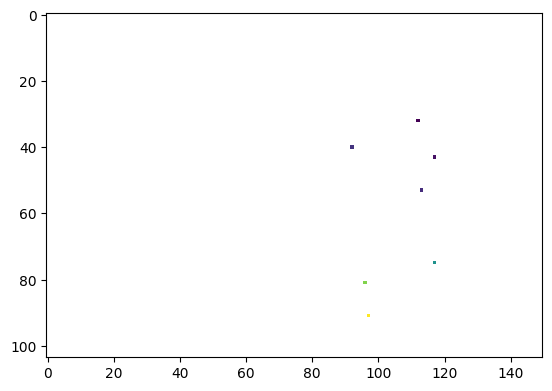

In [16]:
plt.imshow(dataset[0][3][10,:,:].detach().cpu(), )
plt.plot()

[]

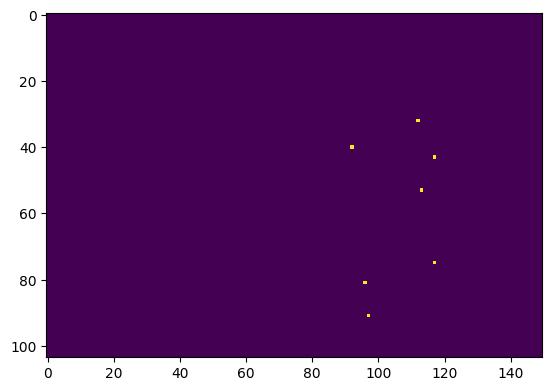

In [17]:
plt.imshow(dataset[0][-1][10,:,:].detach().cpu(), )
plt.plot()

[]

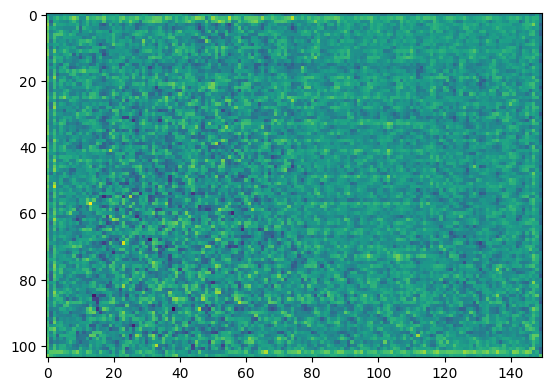

In [ ]:
plt.imshow(prova_out[0,:,:].detach().cpu())
plt.plot()

[]

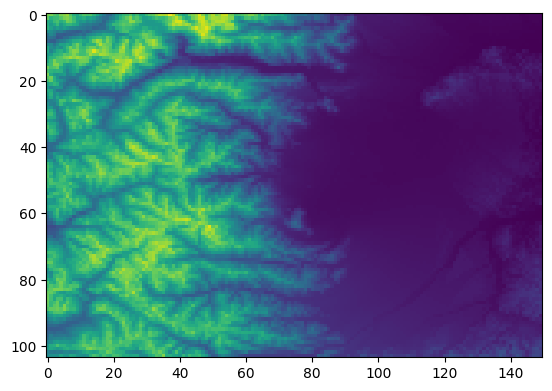

In [18]:
plt.imshow(dataset[0][1][:,:,-1].detach().cpu(), )
plt.plot()

# Loss

In [6]:
from loss import losses_2D

In [7]:
from loss import load_losses

In [48]:
importlib.reload(losses_2D)

<module 'loss.losses_2D' from '/leonardo_scratch/fast/IscrC_DL4EO/github/water-pinns/src/loss/losses_2D.py'>

In [ ]:
torch.nanmean(torch.tensor([np.nan, 1]))

tensor(1.)

In [8]:
prova_loss = load_losses.load_loss(dict_files)

In [14]:
print(prova_out.shape)
print(dataset[0][-3].shape)
print(dataset[0][-1].shape)

NameError: name 'prova_out' is not defined

In [60]:
losses_2D.loss_masked_mse(prova_out, torch.stack([dataset[0][-3],
                                                   dataset[1][-3]], dim = 0),
                          torch.stack([dataset[0][-1],
                                        dataset[1][-1]], dim = 0))

IndexError: The shape of the mask [2, 30, 104, 150] at index 0 does not match the shape of the indexed tensor [1, 30, 104, 150] at index 0

In [28]:
losses_2D.loss_masked_focal_mse(dataset[10][-3].unsqueeze(0) + 0.01,
                                dataset[10][-3].unsqueeze(0),
                                dataset[10][-1].unsqueeze(0))

tensor(1.0000e-04)

In [60]:
losses_2D.loss_masked_focal_mse(prova_out, torch.stack([dataset[0][-3],
                                                   dataset[1][-3]], dim = 0),
                          torch.stack([dataset[0][-1],
                                        dataset[1][-1]], dim = 0))

NameError: name 'prova_out' is not defined

In [43]:
print(dataset[0][-3].shape)
print(dataset[0][-1].shape)

torch.Size([15, 104, 150])
torch.Size([15, 104, 150])


In [36]:
prova_fw = torch.arange(15,0,-1)/(15)
prova_fw = prova_fw[None,:,None,None].expand(2, -1, 3, 3)
prova_fw.shape

torch.Size([2, 15, 3, 3])

In [39]:
prova_fw[1,:,0,1]

tensor([1.0000, 0.9333, 0.8667, 0.8000, 0.7333, 0.6667, 0.6000, 0.5333, 0.4667,
        0.4000, 0.3333, 0.2667, 0.2000, 0.1333, 0.0667])

In [56]:
prova_pred = torch.tensor([[[[[1],[1]],[[1],[1]],[[1],[1]]],[[[1],[1]],[[1],[1]],[[1],[1]]]],
              [[[[0],[0]],[[0],[0]],[[0],[0]]],[[[0],[0]],[[0],[0]],[[0],[0]]]]]).squeeze()
print(prova_pred.shape)

prova_true = torch.tensor([[[[[np.nan],[np.nan]],[[np.nan],[np.nan]],[[np.nan],[np.nan]]],[[[np.nan],[np.nan]],[[np.nan],[np.nan]],[[np.nan],[np.nan]]]],
              [[[[1],[1]],[[1],[1]],[[1],[1]]],[[[1],[1]],[[1],[1]],[[1],[1]]]]]).squeeze()
print(prova_true.shape)

prova_mask = torch.tensor([[[[[False],[False]],[[False],[True]],[[False],[False]]],[[[False],[False]],[[False],[False]],[[False],[False]]]],
              [[[[False],[False]],[[False],[False]],[[False],[False]]],[[[False],[True]],[[False],[False]],[[False],[False]]]]]).squeeze()

print(prova_mask.shape)

torch.Size([2, 2, 3, 2])
torch.Size([2, 2, 3, 2])
torch.Size([2, 2, 3, 2])


In [58]:
importlib.reload(losses_2D)

<module 'loss.losses_2D' from '/leonardo_scratch/fast/IscrC_DL4EO/github/water-pinns/src/loss/losses_2D.py'>

In [59]:
losses_2D.loss_masked_focal_mse(prova_pred,
                                prova_true,
                                prova_mask)

tensor(0.5000)

In [55]:
losses_2D.loss_masked_focal_mse(prova_pred,
                                prova_true,
                                prova_mask)

tensor(False)
torch.Size([2, 3, 2])
tensor([[[nan, nan],
         [nan, 1.],
         [nan, nan]],

        [[nan, 1.],
         [nan, nan],
         [nan, nan]]])


tensor(1.)

# Plots

In [ ]:
# Creare Xarray da previsione

# Plot mappa

# Plot serie storica su stazioni lasciate fuori

In [14]:
def test_prediction(start_date, twindow, dataset):
    
    X, X_mask = dataset.get_icon_target_data(start_date)
    Z = torch.from_numpy(dataset.target_rasterized_coords).to(torch.float32)
    W = dataset.get_weather_video(start_date, end_date = start_date + np.timedelta64(twindow, "D"))
    Y, Y_mask = dataset.get_target_video(dataset.get_iloc_from_date(start_date), twindow)
    
    return [X.unsqueeze(0),
            Z.unsqueeze(0),
            [W[0].unsqueeze(0), W[1].unsqueeze(0)],
            Y,
            X_mask.unsqueeze(0),
            Y_mask]
    

In [15]:
start_date = np.datetime64("2001-01-01")
twindow = 180

In [16]:
X_test, Z_test, W_test, Y_test, X_mask_test, Y_mask_test = test_prediction(start_date = start_date,
                                                                           twindow = twindow,
                                                                           dataset = dataset)

In [17]:
prova_out_test = model(X = X_test,
      Z = Z_test,
      W = W_test,
      X_mask = X_mask_test)

In [28]:
prova_out_test.detach().cpu().shape

torch.Size([180, 104, 150])

In [18]:
denorm_Y_hat = (prova_out_test.detach().cpu() * dataset.norm_factors["target_std"]) + dataset.norm_factors["target_mean"]
Y_hat_xr = xarray.DataArray(data = denorm_Y_hat,
                                coords = dict(
                                            lat=("lat", dataset.wtd_data_raserized.y.values),
                                            lon=("lon", dataset.wtd_data_raserized.x.values),
                                            time=pd.date_range(start_date + np.timedelta64(1, "D"),
                                                            start_date + np.timedelta64(twindow, "D"),
                                                            freq = "D")),
                                dims = ["time","lat", "lon"]
                                )

In [19]:
denorm_Y = (Y_test * dataset.norm_factors["target_std"]) + dataset.norm_factors["target_mean"]
Y_xr = xarray.DataArray(data = denorm_Y,
                                coords = dict(
                                            lat=("lat", dataset.wtd_data_raserized.y.values),
                                            lon=("lon", dataset.wtd_data_raserized.x.values),
                                            time=pd.date_range(start_date + np.timedelta64(1, "D"),
                                                            start_date + np.timedelta64(twindow, "D"),
                                                            freq = "D")),
                                dims = ["time","lat", "lon"]
                                )

In [28]:
dataset.target_rasterized_dtm.values.squeeze().shape

(104, 150)

In [20]:
Y_hat_xr[0].shape

(104, 150)

In [31]:
dataset.target_rasterized_dtm.values.squeeze().shape

(104, 150)

In [36]:
dataset.target_rasterized_dtm.values

array([[[2792.1875 , 2829.3582 , 2609.7654 , ...,  211.16365,
          207.52904,  204.13618],
        [2665.923  , 2287.5603 , 2416.2598 , ...,  204.26414,
          199.297  ,  194.18564],
        [2200.9866 , 2125.1995 , 2417.194  , ...,  196.36641,
          195.0294 ,  192.01106],
        ...,
        [1972.0929 , 2143.598  , 2063.7307 , ...,  841.11383,
          889.2327 ,  710.4286 ],
        [1634.1074 , 1562.986  , 1499.7627 , ...,  793.004  ,
          857.5617 ,  840.80304],
        [1714.8643 , 1835.9161 , 1859.6628 , ...,  869.41656,
          874.2126 ,  821.18146]]], dtype=float32)

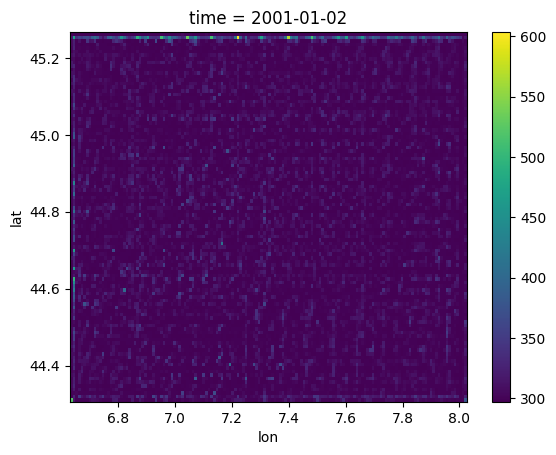

In [34]:
Y_hat_xr[0].plot()

In [35]:
Y_hat_xr

NameError: name 'Y_hat_xr' is not defined

In [ ]:
WTD_test = dataset.target_rasterized_dtm.values - Y_hat_xr

In [48]:
WTD_test[0,:,:]

<xarray.DataArray (lat: 104, lon: 150)> Size: 62kB
array([[2493.6667  , 2530.8196  , 2311.2014  , ...,  -87.36833 ,
         -91.009415,  -94.404465],
       [2346.4104  , 1820.1411  , 2077.8499  , ..., -133.95695 ,
        -103.418884, -120.925476],
       [1895.714   , 1802.6826  , 2118.056   , ..., -101.32585 ,
        -108.78334 , -106.48683 ],
       ...,
       [1673.5728  , 1842.6825  , 1760.5378  , ...,  543.0298  ,
         586.9723  ,  411.92535 ],
       [1335.3289  , 1236.5142  , 1199.7169  , ...,  493.47385 ,
         556.8729  ,  515.90814 ],
       [1191.8586  , 1519.6072  , 1560.2708  , ...,  570.9713  ,
         574.4142  ,  443.36923 ]], dtype=float32)
Coordinates:
  * lat      (lat) float64 832B 45.26 45.25 45.24 45.23 ... 44.33 44.32 44.31
  * lon      (lon) float64 1kB 6.636 6.645 6.654 6.663 ... 8.003 8.012 8.021
    time     datetime64[ns] 8B 2001-01-02

In [45]:
Y_hat_xr.values.min()

np.float32(-168.39304)

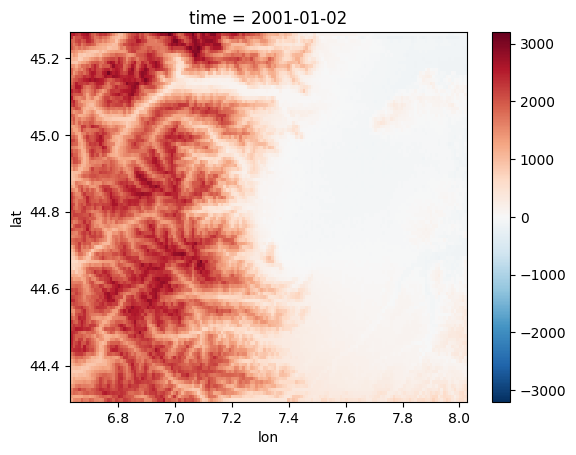

In [39]:
WTD_test[0].plot()

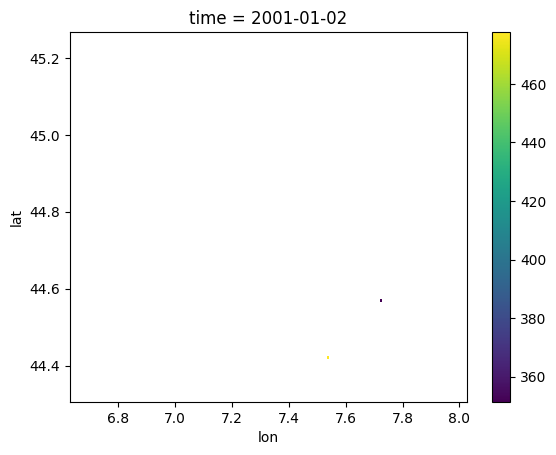

In [68]:
Y_xr[0].plot()

In [60]:
dataset.wtd_names.loc[dataset.wtd_names["sensor_id"] == "00417910001", "munic"].values[0]
# Racconigi: (7.68794 44.77265);  00417910001
# Tarantasca: (7.53227 44.51818);
# Torino: (7.71871 45.07816)

'Racconigi'

In [61]:
dataset.wtd_names.loc[dataset.wtd_names["munic"] == "Tarantasca"]

,sensor_id,wb_id,loc_name,munic,loc,sart_date,end_date,gw_type,geometry,height
7,00422510001,GWB-S6,P2 Tarantasca,Tarantasca,"Parcheggio cimitero Fraz. S.Cristina, Via R. S...",2009-01-01,None,Shallow,POINT (7.53227 44.51818),451.783295


In [34]:
Y_xr.sel(lon  = 7.68794, lat = 44.77265, method = "nearest")

<xarray.DataArray (time: 180)> Size: 720B
array([      nan,       nan,       nan,       nan,       nan,       nan,
             nan,       nan,       nan, 252.95532, 252.957  , 253.02866,
       253.11032, 253.09033, 253.00032, 252.96533, 252.95366, 252.91032,
       252.97198, 253.07033, 253.03198, 252.97533, 252.88866, 252.84698,
       252.81699, 252.91699, 253.00699, 252.94531, 252.87532, 252.82199,
       252.83365, 252.762  , 252.86533, 252.94199, 252.90698, 252.75366,
       252.73032, 252.70865, 252.72865, 252.80199, 252.86699, 252.82031,
       252.75032, 252.71533, 252.68533, 252.66032, 252.717  , 252.81866,
       252.767  , 252.65866, 252.64032, 252.73532, 252.71199, 252.74033,
       252.79866, 252.71199, 252.63367, 252.57532, 252.57532, 252.53032,
       252.64532, 252.72198, 252.68199, 252.61865, 252.56532, 252.58032,
       252.54866, 252.66365, 252.767  , 252.71866, 252.70032, 252.66866,
       252.65698, 252.66365, 252.78198, 252.86699, 252.842  , 252.78366,
       252.79033, 252.82365, 252.81366, 252.84698, 252.95865, 252.887  ,
       252.89032, 252.81032, 252.84532, 252.91699, 252.98032, 253.00699,
       253.02365, 252.96365, 252.892  , 252.87033, 252.84366, 252.872  ,
       252.967  , 252.88531, 252.80699, 252.81699, 252.78198, 252.872  ,
       252.922  , 252.94531, 252.95865, 252.90866, 252.79532, 252.75699,
       252.75699, 252.80365, 252.88367, 252.83865, 252.732  , 252.82031,
       252.74533, 252.73532, 252.75867, 252.84532, 252.86699, 252.88033,
       252.81866, 252.76865, 252.71533, 252.83865, 252.93199, 252.96199,
       252.97865, 252.99533, 252.95366, 252.81532, 252.91365, 252.97533,
       252.91866, 252.82866, 252.90866, 252.96199, 252.98698, 252.997  ,
       253.00366, 252.93365, 252.86032, 252.79033, 252.79532, 252.79199,
       252.83699, 252.92699, 252.842  , 252.81866, 252.76532, 252.73366,
       252.82199, 252.88531, 252.91032, 252.84532, 252.73532, 252.73866,
       252.78366, 252.77032, 252.81198, 252.87698, 252.82365, 252.74533,
       252.82031, 252.86533, 252.88199, 252.90033, 252.91866, 252.81532,
       252.732  , 252.64532, 252.64865, 252.62866, 252.68698, 252.76532,
       252.69366, 252.58365, 252.51366, 252.49033, 252.50867, 252.58199],
      dtype=float32)
Coordinates:
    lat      float64 8B 44.77
    lon      float64 8B 7.686
  * time     (time) datetime64[ns] 1kB 2001-01-02 2001-01-03 ... 2001-06-30

In [35]:
Y_hat_xr.sel(lon  = 7.68794, lat = 44.77265, method = "nearest").values

array([336.72757, 362.67438, 376.03436, 375.54736, 368.6311 , 355.72284,
       352.35483, 352.76498, 348.2217 , 345.9686 , 341.27005, 346.56226,
       348.9769 , 349.68613, 346.2199 , 343.26895, 339.3215 , 341.32867,
       341.2365 , 339.8535 , 338.23505, 337.28076, 337.156  , 333.67654,
       330.17178, 328.7143 , 327.6133 , 326.80005, 325.3003 , 324.19415,
       323.71695, 323.08853, 323.83945, 324.26773, 322.26447, 319.0927 ,
       315.0664 , 315.41687, 315.12817, 316.04935, 315.61005, 315.6611 ,
       314.1266 , 314.34286, 312.8443 , 313.02982, 311.85315, 312.65958,
       312.3701 , 311.7596 , 310.39407, 311.7019 , 311.1591 , 311.45233,
       312.47897, 311.29614, 311.90298, 312.23087, 309.38248, 308.27634,
       309.2332 , 309.6492 , 310.7826 , 310.3709 , 310.416  , 309.00903,
       314.14148, 313.81232, 313.8585 , 310.41156, 309.23398, 309.80472,
       309.55496, 309.22656, 311.20508, 311.04422, 311.48993, 313.08035,
       313.3063 , 311.33075, 311.0093 , 312.30624, 

<Axes: >

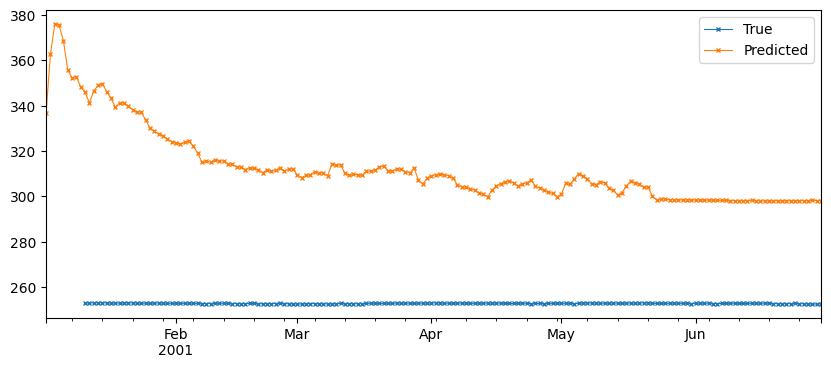

In [ ]:
ts_pred = pd.DataFrame({"True": Y_xr.sel(lon  = 7.68794, lat = 44.77265, method = "nearest"),
                       "Predicted": Y_hat_xr.sel(lon  = 7.68794, lat = 44.77265, method = "nearest").values,
                       },
                       index = Y_hat_xr.sel(lon  = 7.68794, lat = 44.77265, method = "nearest").time.values)
fig, ax = 
ts_pred.plot(marker = "x", markersize = 2.5, linewidth = 0.8, figsize = (10,4))

<Axes: >

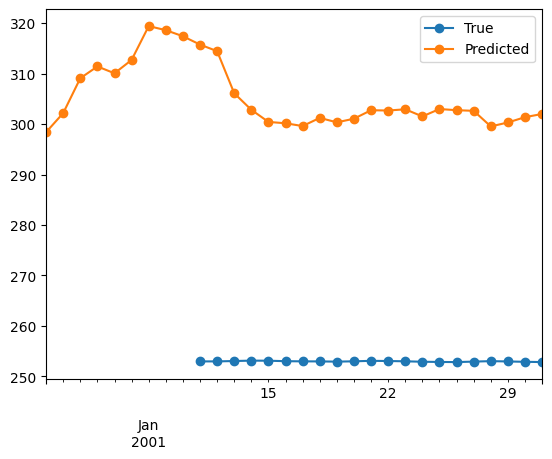

In [ ]:
ts_pred = pd.DataFrame({"True": Y_xr.sel(lon  = 7.68794, lat = 44.77265, method = "nearest"),
                       "Predicted": Y_hat_xr.sel(lon  = 7.68794, lat = 44.77265, method = "nearest").values,
                       },
                       index = Y_hat_xr.sel(lon  = 7.68794, lat = 44.77265, method = "nearest").time.values)
ts_pred.plot(marker = "o")

In [102]:
#dataset.wtd_df.loc[pd.IndexSlice[slice('2001-01-01', '2001-01-31'), "00417910001"],"h"].plot()

<Axes: >

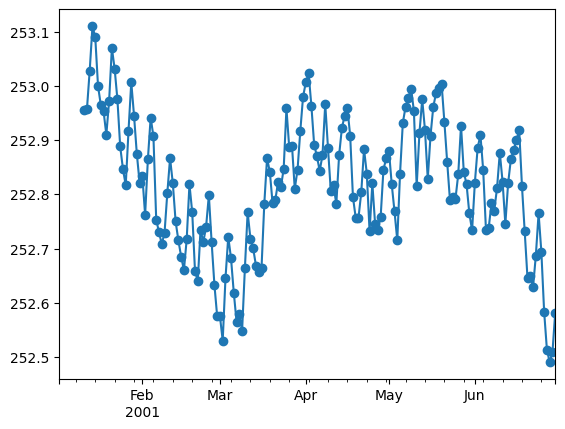

In [37]:
ts_pred["True"].plot(marker = "o")

<Axes: >

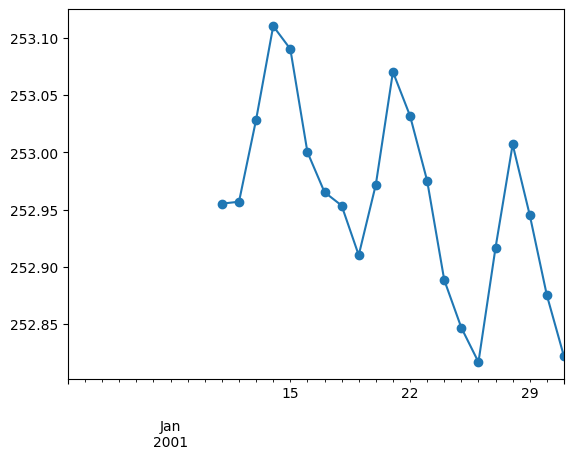

In [96]:
ts_pred["True"].plot(marker = "o")

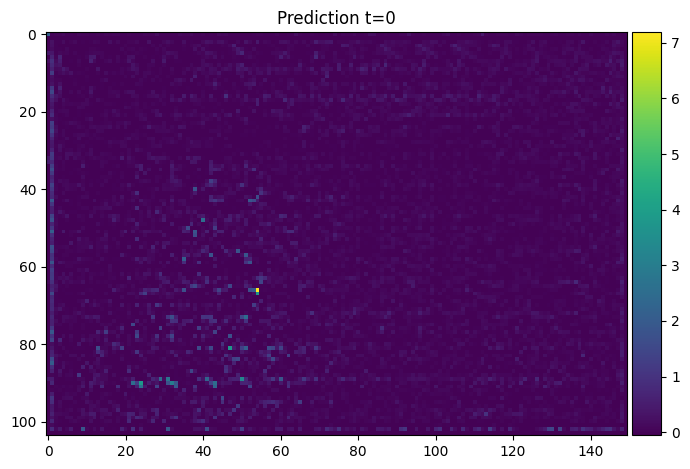

In [58]:
timestep = 0
fig, ax = plt.subplots(figsize = (7,7))
ax.set_title(f"Prediction t={timestep}")
image = ax.imshow(prova_out[timestep,:,:].detach().cpu())

divider = make_axes_locatable(ax)
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(image, cax = cax)
plt.tight_layout()

In [ ]:
## old

In [65]:
prova_c = dataset.coordinates_xr(dataset.wtd_data_raserized, coord_name = "xy")
dataset.dtm_roi.sel(x = dataset.wtd_data_raserized.x,
                    y = dataset.wtd_data_raserized.y,
                    method = "nearest")

<xarray.DataArray '__xarray_dataarray_variable__' (band: 1, y: 104, x: 150)> Size: 62kB
array([[[ 1.8678781 ,  1.9098884 ,  1.6617045 , ..., -1.0491954 ,
         -1.0533031 , -1.0571378 ],
        [ 1.7251741 ,  1.2975484 ,  1.4430045 , ..., -1.0569931 ,
         -1.062607  , -1.0683838 ],
        [ 1.1997027 ,  1.1140481 ,  1.4440604 , ..., -1.0659192 ,
         -1.0674303 , -1.0708417 ],
        ...,
        [ 0.9410071 ,  1.134842  ,  1.0445762 , ..., -0.3372256 ,
         -0.28284162, -0.48492607],
        [ 0.55901587,  0.47863436,  0.40717942, ..., -0.3915993 ,
         -0.3186362 , -0.33757684],
        [ 0.6502872 ,  0.7871001 ,  0.8139386 , ..., -0.30523783,
         -0.29981738, -0.35975316]]], dtype=float32)
Coordinates:
  * band         (band) int64 8B 1
  * x            (x) float64 1kB 6.636 6.645 6.654 6.663 ... 8.002 8.012 8.022
  * y            (y) float64 832B 45.26 45.25 45.24 45.23 ... 44.33 44.32 44.31
    spatial_ref  int64 8B 0

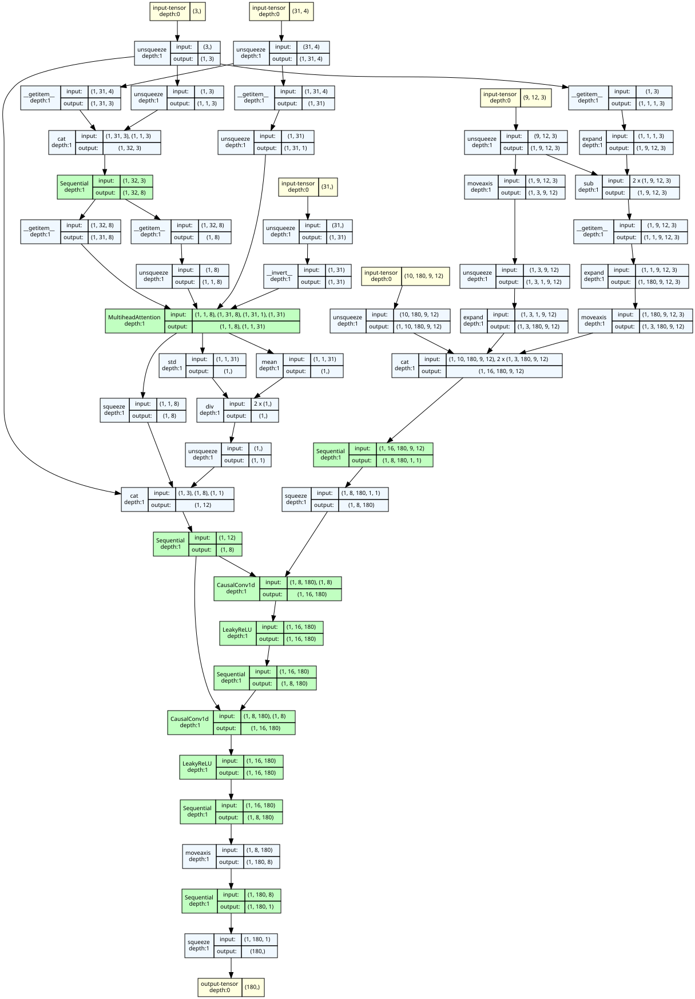

In [ ]:
draw_graph(model,
           input_data=(alt_ds[0][0],
                       alt_ds[0][1],
                       [alt_ds[0][2],
                        weather_coords],
                       alt_ds[0][4]),
           depth = 1, device="cpu").visual_graph

In [19]:
ds.get_weather_coords(dtm =True)[:,:,2].detach().mean()

tensor(-0.1063)

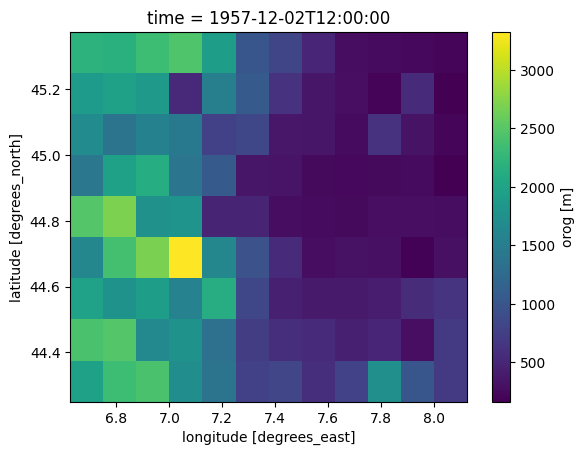

In [18]:
xarray.open_dataset("/leonardo_work/IscrC_DL4EO/trials/data/dtm_ROI_arpa_weather.nc")["orog"].plot()

In [50]:
ds[0][3]

tensor([    nan,     nan, -0.2077,     nan,     nan, -0.2077,     nan,     nan,
        -0.2077,     nan,     nan, -0.2077,     nan,     nan, -0.2077,     nan,
            nan, -0.2077,     nan,     nan, -0.2077,     nan,     nan, -0.2077,
            nan,     nan, -0.2077,     nan,     nan,     nan, -0.2077,     nan,
            nan, -0.2091,     nan, -0.2091,     nan,     nan,     nan, -0.2104,
            nan,     nan, -0.2104,     nan,     nan, -0.2118,     nan,     nan,
        -0.2118,     nan,     nan, -0.2118,     nan,     nan, -0.2118,     nan,
            nan, -0.2118, -0.2104,     nan,     nan, -0.2104,     nan,     nan,
        -0.2104,     nan,     nan, -0.2050,     nan,     nan, -0.2050,     nan,
            nan, -0.2023,     nan,     nan, -0.2023,     nan,     nan, -0.2050,
            nan,     nan, -0.2050,     nan,     nan, -0.2050,     nan,     nan,
            nan, -0.2064,     nan,     nan, -0.2077,     nan,     nan, -0.2077,
            nan,     nan, -0.2077,     n

In [8]:
print(f"Length of the dataset: {ds.__len__()}")

Length of the dataset: 254820


In [8]:
len(ds.dtm_roi.y.values)

1146

In [9]:
i = 100
ds.dtm_roi.x.values[i] - ds.dtm_roi.x.values[i - 1]

np.float64(0.0008333333333325754)

In [10]:
i = 1
ds.dtm_roi.y.values[i] - ds.dtm_roi.y.values[i - 1]

np.float64(-0.0008333333333325754)

In [55]:
step = 0.001

In [35]:
import geopy.distance

In [54]:
ds_2D.dtm_roi

<xarray.DataArray '__xarray_dataarray_variable__' (band: 1, y: 1146, x: 1684)> Size: 8MB
array([[[3165.9429 , 3190.0159 , ...,  202.6952 ,  202.38902],
        [3127.6099 , 3133.189  , ...,  202.07877,  202.08029],
        ...,
        [1861.1785 , 1851.5795 , ...,  725.16925,  706.9846 ],
        [1906.2725 , 1897.0889 , ...,  754.2417 ,  743.1294 ]]], dtype=float32)
Coordinates:
  * band         (band) int64 8B 1
  * x            (x) float64 13kB 6.627 6.627 6.628 6.629 ... 8.027 8.028 8.029
  * y            (y) float64 9kB 45.27 45.26 45.26 45.26 ... 44.31 44.31 44.31
    spatial_ref  int64 8B 0
Attributes:
    NETCDF_DIM_EXTRA:  {band}
    AREA_OR_POINT:     Area
    scale_factor:      1.0
    add_offset:        0.0
    NETCDF_DIM_band:   1
    _FillValue:        nan

In [59]:
spatial_resolution_meteo =  geopy.distance.geodesic((ds_2D.dtm_roi.y.values[1000],
                               ds_2D.dtm_roi.x.values[1000]),
                               (ds_2D.dtm_roi.y.values[1000],
                                ds_2D.dtm_roi.x.values[1001])).km
print("Resolution in km: ", round(spatial_resolution_meteo, 5))

Resolution in km:  0.06635


In [61]:
# Compute the resolution in km
spatial_resolution_meteo =  geopy.distance.geodesic((ds_2D.dtm_roi.y.values[0],
                               ds_2D.dtm_roi.x.values[0]),
                               (ds_2D.dtm_roi.y.values[1],
                                ds_2D.dtm_roi.x.values[0])).km
print("Resolution in km: ", round(spatial_resolution_meteo, 3))

Resolution in km:  0.093


In [16]:
torch.repeat_interleave(torch.tensor([[0,0,0],
                                      [1,1,1]]), 2, dim=0)

tensor([[0, 0, 0],
        [0, 0, 0],
        [1, 1, 1],
        [1, 1, 1]])

# Model 

In [15]:
device = (
    "cuda"
    if torch.cuda.is_available()
    else "mps"
    if torch.backends.mps.is_available()
    else "cpu"
)

In [13]:
if dict_files["model"] == "SC_LSTM_idw":
    print("model idw")
    model = SC_LSTM_idw(timestep = dict_files["timesteps"],
                 cb_fc_layer = dict_files["cb_fc_layer"],
                 cb_fc_neurons = dict_files["cb_fc_neurons"],
                 conv_filters = dict_files["conv_filters"],
                 lstm_layer = dict_files["lstm_layer"],
                 lstm_input_units = dict_files["lstm_input_units"],
                 lstm_units = dict_files["lstm_units"]
                 ).to(device)

elif dict_files["model"] == "SC_LSTM_att":
    print("model att")
    model = SC_LSTM_att(timestep = dict_files["timesteps"],
                 cb_emb_dim = dict_files["cb_emb_dim"],
                 cb_att_h = dict_files["cb_att_h"],
                 cb_fc_layer = dict_files["cb_fc_layer"],
                 cb_fc_neurons = dict_files["cb_fc_neurons"],
                 conv_filters = dict_files["conv_filters"],
                 lstm_layer = dict_files["lstm_layer"],
                 lstm_input_units = dict_files["lstm_input_units"],
                 lstm_units = dict_files["lstm_units"]
                 ).to(device)
    
elif dict_files["model"] == "SC_CCNN_att":
    print("model causal cnn att")
    model = SC_CCNN_att(timestep = dict_files["timesteps"],
                 cb_emb_dim = dict_files["cb_emb_dim"],
                 cb_att_h = dict_files["cb_att_h"],
                 cb_fc_layer = dict_files["cb_fc_layer"],
                 cb_fc_neurons = dict_files["cb_fc_neurons"],
                 conv_filters = dict_files["conv_filters"],
                 ccnn_input_filters =  dict_files["ccnn_input_filters"],
                 ccnn_kernel_size =  dict_files["ccnn_kernel_size"],
                 ccnn_n_filters =  dict_files["ccnn_n_filters"],
                 ccnn_n_layers =  2,
                 ).to(device)


model causal cnn att


In [14]:
model_path = "/leonardo_scratch/fast/IscrC_DL4EO/results/continuous_1d/models/model_20250120_163649.pt"
model.load_state_dict(torch.load(model_path, weights_only=True, map_location=torch.device('cpu')))
model.eval()

SC_CCNN_att(
  (cb_emb): Sequential(
    (0): Linear(in_features=3, out_features=8, bias=True)
    (1): LeakyReLU(negative_slope=0.01)
  )
  (multihead_att): MultiheadAttention(
    (out_proj): NonDynamicallyQuantizableLinear(in_features=8, out_features=8, bias=True)
  )
  (cb_fc): Sequential(
    (0): Linear(in_features=12, out_features=16, bias=True)
    (1): LeakyReLU(negative_slope=0.01)
    (2): Linear(in_features=16, out_features=8, bias=True)
    (3): LeakyReLU(negative_slope=0.01)
  )
  (conv3d_stack): Sequential(
    (0): Conv3d(16, 16, kernel_size=(1, 2, 2), stride=(1, 1, 1))
    (1): BatchNorm3d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.01)
    (3): Conv3d(16, 16, kernel_size=(1, 2, 2), stride=(1, 1, 1))
    (4): BatchNorm3d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): LeakyReLU(negative_slope=0.01)
    (6): Conv3d(16, 16, kernel_size=(1, 2, 2), stride=(1, 1, 1))
    (7): BatchNorm3

In [23]:
print("Total number of trainable parameters: " ,sum(p.numel() for p in model.parameters() if p.requires_grad))

Total number of trainable parameters:  9265


In [24]:
model

SC_CCNN_att(
  (cb_emb): Sequential(
    (0): Linear(in_features=3, out_features=8, bias=True)
    (1): LeakyReLU(negative_slope=0.01)
  )
  (multihead_att): MultiheadAttention(
    (out_proj): NonDynamicallyQuantizableLinear(in_features=8, out_features=8, bias=True)
  )
  (cb_fc): Sequential(
    (0): Linear(in_features=12, out_features=16, bias=True)
    (1): LeakyReLU(negative_slope=0.01)
    (2): Linear(in_features=16, out_features=8, bias=True)
    (3): LeakyReLU(negative_slope=0.01)
  )
  (conv3d_stack): Sequential(
    (0): Conv3d(16, 16, kernel_size=(1, 2, 2), stride=(1, 1, 1))
    (1): BatchNorm3d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.01)
    (3): Conv3d(16, 16, kernel_size=(1, 2, 2), stride=(1, 1, 1))
    (4): BatchNorm3d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): LeakyReLU(negative_slope=0.01)
    (6): Conv3d(16, 16, kernel_size=(1, 2, 2), stride=(1, 1, 1))
    (7): BatchNorm3

In [25]:
weather_coords = ds.get_weather_coords()
weather_dtm = ds.get_weather_dtm()
weather_coords = torch.cat([weather_coords, weather_dtm], dim = -1)
weather_coords_batch = weather_coords.unsqueeze(0).expand(1, -1, -1, -1).requires_grad_()

x = ds[2000][0][None,:,:].expand(1 , -1, -1).requires_grad_()
z = ds[2000][1][None, :].expand(1, -1).requires_grad_()
w_0 = ds[2000][2].unsqueeze(0).expand(1, -1, -1, -1, -1).requires_grad_()
w_1 = weather_coords_batch

x_mask = ds[2000][4][None, :].expand(1, -1)

target_pred = model(x = x,
      z = z,
      w = [w_0, w_1],
      x_mask = x_mask)

target_pred.shape

TypeError: ContinuousDataset.get_avail_target_data() takes 2 positional arguments but 3 were given

In [13]:
len(target_pred.shape)

1

# Plots TS

In [14]:
ds.sensor_id_list

array(['00405910001', '00408910001', '00407810001', '00105910001',
       '00112710001', '00126010001', '00417910001', '00422510001',
       '00127210001', '00103510001', '00401210001', '00403410001',
       '00421510001', '00119710001', '00402910001', '00425010001',
       '00105910002', '00414310002', '00109010001', '00127210003',
       '00117110001', '00131010001', '00408910002', '00421710001',
       '00104110001', '00107010001', '00105110001', '00404110001',
       '00121510001', '00104810001', '00127210005'], dtype=object)

In [13]:
ds.wtd_df

wtd       lon       lat    height  nan_mask  \
date       sensor_id                                                        
2001-01-01 00405910001   1.800000  0.613639 -0.353667 -0.965821      True   
           00408910001   3.981667  0.813198 -0.759672 -0.886174      True   
           00407810001  39.876667  0.374769 -1.221921 -0.702913      True   
           00105910001        NaN  0.807151  0.148287 -1.018794     False   
           00112710001        NaN  0.689774  0.464772 -1.034881     False   
...                           ...       ...       ...       ...       ...   
2023-12-31 00105110001   3.553333  0.517267  0.444808 -1.021212      True   
           00404110001        NaN  0.833452 -0.080484 -0.998107     False   
           00121510001  14.500000  1.203523  0.596678 -0.974594      True   
           00104810001   2.056667  0.915711  0.472337 -1.014218      True   
           00127210005        NaN  0.667861  0.655431 -1.026275     False   

                               h  
date       sensor_id              
2001-01-01 00405910001 -0.207732  
           00408910001  0.714166  
           00407810001  2.418561  
           00105910001       NaN  
           00112710001       NaN  
...                          ...  
2023-12-31 00105110001 -0.893013  
           00404110001       NaN  
           00121510001 -0.483960  
           00104810001 -0.789269  
           00127210005       NaN  

[260400 rows x 6 columns]

In [15]:
ds.wtd_df.loc[pd.IndexSlice[:, ds.sensor_id_list[0]],
              :]

,,wtd,lon,lat,height,nan_mask,h
date,sensor_id,,,,,,
2001-01-01,00405910001,1.8,0.613639,-0.353667,-0.965821,True,-0.207732
2001-01-02,00405910001,NaN,0.613639,-0.353667,-0.965821,False,NaN
2001-01-03,00405910001,NaN,0.613639,-0.353667,-0.965821,False,NaN
2001-01-04,00405910001,1.8,0.613639,-0.353667,-0.965821,True,-0.207732
2001-01-05,00405910001,NaN,0.613639,-0.353667,-0.965821,False,NaN
...,...,...,...,...,...,...,...
2023-12-27,00405910001,NaN,0.613639,-0.353667,-0.965821,False,NaN
2023-12-28,00405910001,NaN,0.613639,-0.353667,-0.965821,False,NaN
2023-12-29,00405910001,NaN,0.613639,-0.353667,-0.965821,False,NaN


In [23]:
ax.get_ylim()[1]

np.float64(5.808416666666666)

/scratch_local/ipykernel_2218075/2453460155.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize = (25,4))


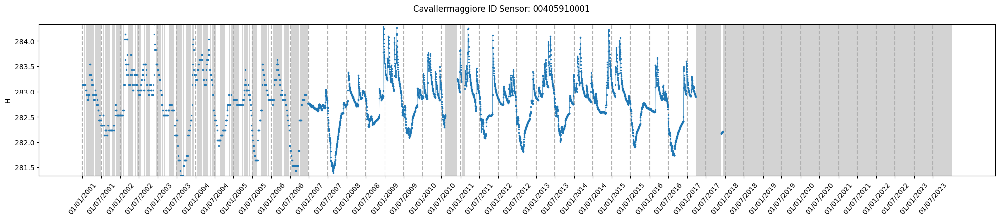

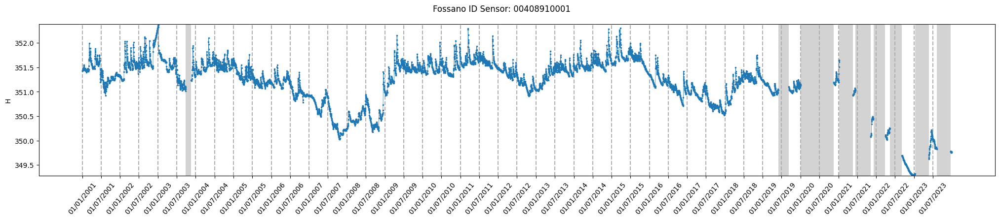

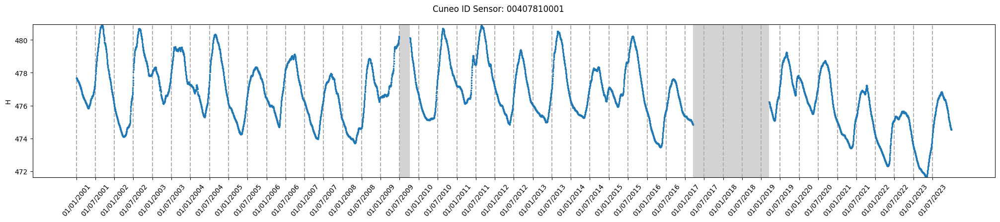

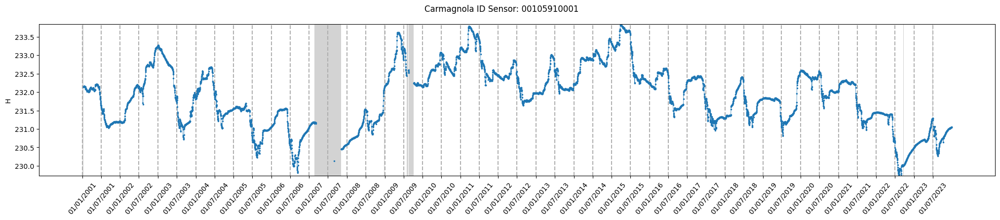

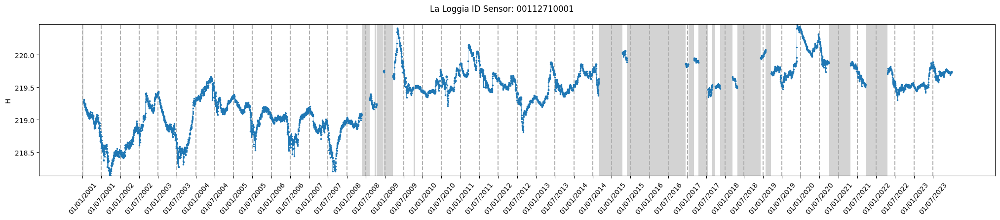

...

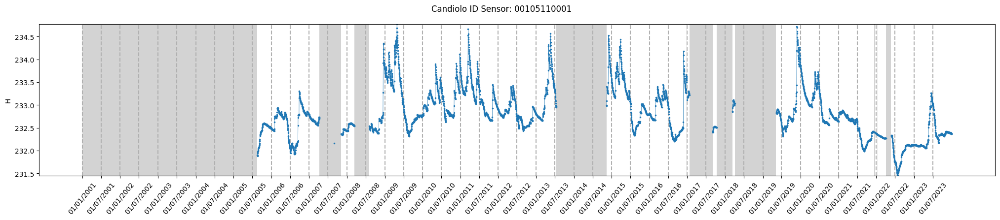

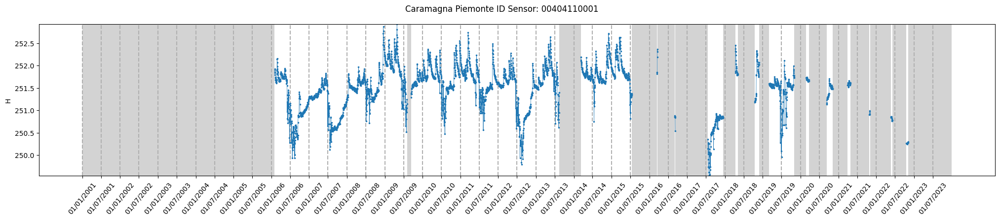

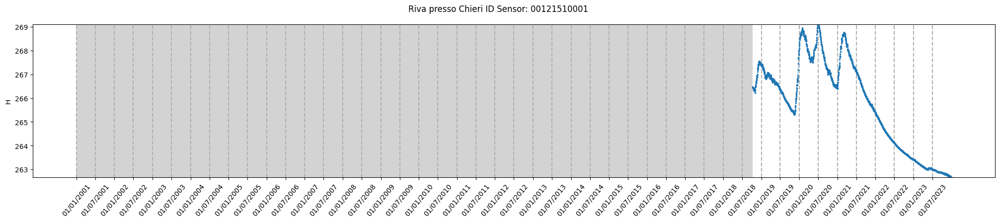

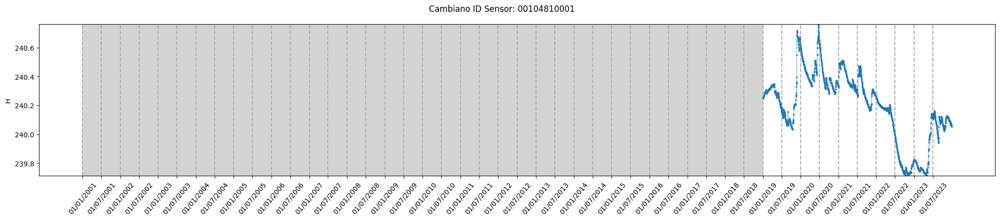

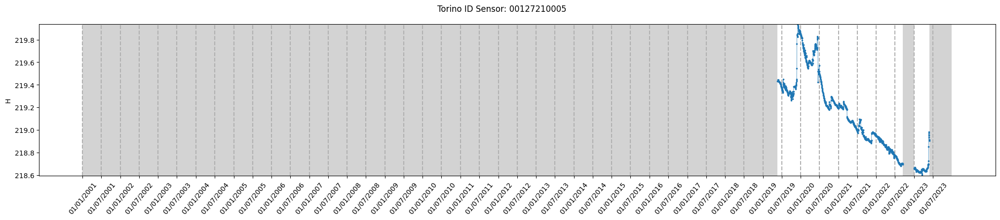

In [18]:
for sensor_idx in range(len(ds.sensor_id_list)):
        
    sensor_series = ds.wtd_df.loc[pd.IndexSlice[:, ds.sensor_id_list[sensor_idx]],
              "h"]
    
    sensor_series = (sensor_series * ds.norm_factors["target_std"]) + ds.norm_factors["target_mean"]
    
    sensor_series_dates = sensor_series.index.get_level_values(0)
    
    municipality = ds.wtd_names.loc[ds.wtd_names["sensor_id"] == ds.sensor_id_list[sensor_idx],
                                    "munic"].values[0]
    
    fig, ax = plt.subplots(figsize = (25,4))
    
    fig.suptitle(f"{municipality} ID Sensor: {ds.sensor_id_list[sensor_idx]}")
    
    ax.plot(sensor_series_dates,
            sensor_series.values, 
            marker = "o",
            lw = 0.5,
            markersize = 1.5)
    
    ax.set_ylabel("H")
    
    date_xticks = pd.date_range(np.datetime64("2001-01-01"), np.datetime64("2023-12-31"), freq = "6MS",  normalize = True, inclusive = "both")
    
    ax.set_ylim([sensor_series.min(),
                 sensor_series.max()])
    
    ax.bar(sensor_series_dates[sensor_series.isnull()],
                      bottom = ax.get_ylim()[0],
                      height = ax.get_ylim()[1],
                      width= 1,
                      align='center',
                      color = 'lightgrey',
                      #alpha = 0.6,
                      label = "Water Table\nMissing Values", zorder = 0)
    
    ax.set_xticks(date_xticks, date_xticks.strftime('%d/%m/%Y'))
    ax.tick_params(axis = "x", rotation=50 )
    ax.grid(axis="x", ls = "--", which = "both", lw = "1.5")

/scratch_local/ipykernel_1282856/763695724.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize = (25,4))


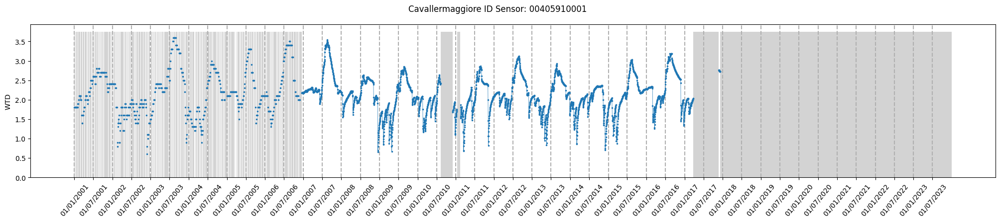

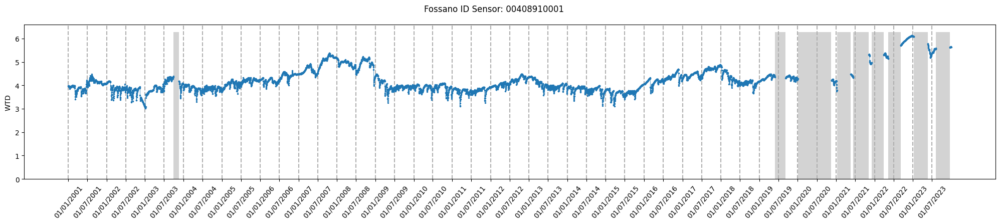

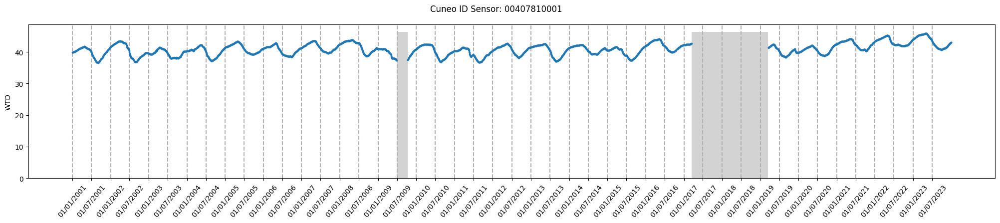

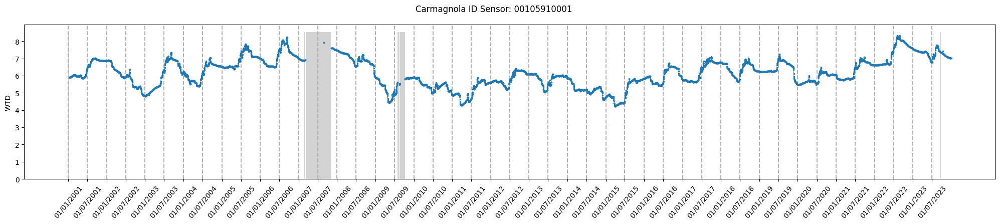

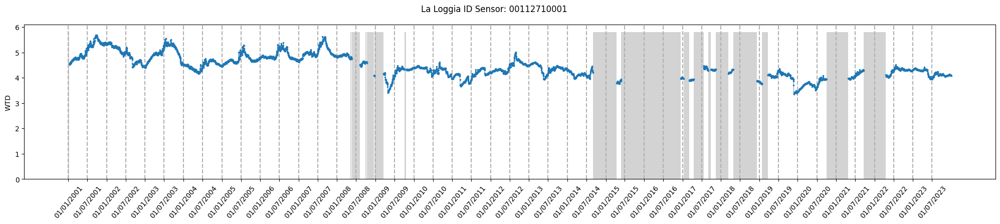

...

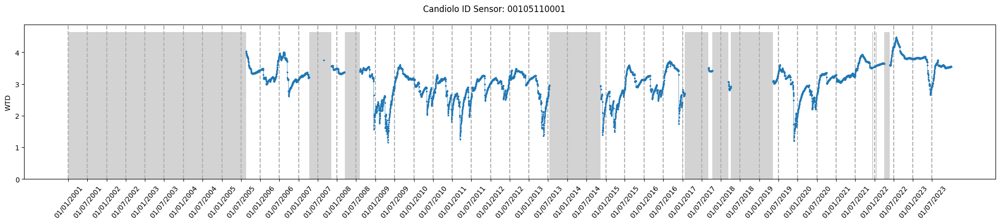

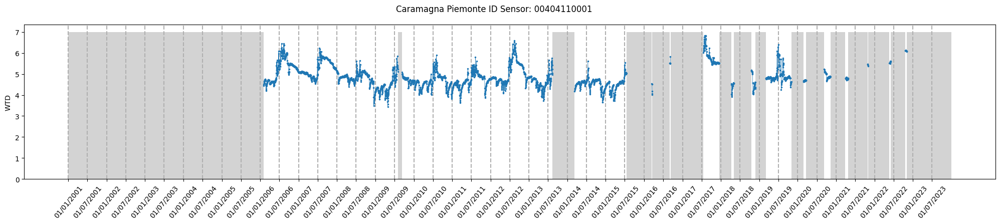

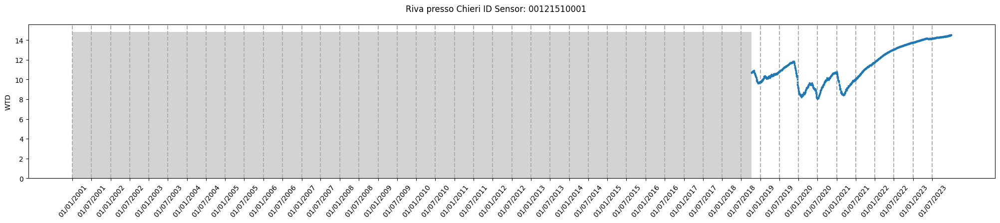

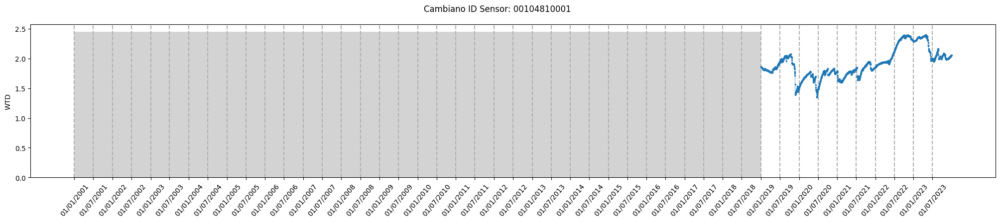

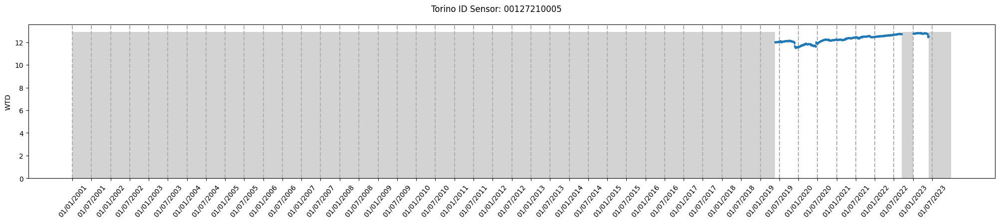

In [42]:
for sensor_idx in range(len(ds.sensor_id_list)):
        
    sensor_series = ds.wtd_df.loc[pd.IndexSlice[:, ds.sensor_id_list[sensor_idx]],
              "wtd"]
    
    sensor_series_dates = sensor_series.index.get_level_values(0)
    
    municipality = ds.wtd_names.loc[ds.wtd_names["sensor_id"] == ds.sensor_id_list[sensor_idx],
                                    "munic"].values[0]
    
    fig, ax = plt.subplots(figsize = (25,4))
    
    fig.suptitle(f"{municipality} ID Sensor: {ds.sensor_id_list[sensor_idx]}")
    
    ax.plot(sensor_series_dates,
            sensor_series.values, 
            marker = "o",
            lw = 0.5,
            markersize = 1.5)
    ax.set_ylabel("WTD")
    
    date_xticks = pd.date_range(np.datetime64("2001-01-01"), np.datetime64("2023-12-31"), freq = "6MS",  normalize = True, inclusive = "both")
    
    ax.bar(sensor_series_dates[sensor_series.isnull()],
                      bottom = 0,
                      height = ax.get_ylim()[1],
                      width= 1,
                      align='center',
                      color = 'lightgrey',
                      #alpha = 0.6,
                      label = "Water Table\nMissing Values", zorder = 0)
    
    ax.set_xticks(date_xticks, date_xticks.strftime('%d/%m/%Y'))
    ax.tick_params(axis = "x", rotation=50 )
    ax.grid(axis="x", ls = "--", which = "both", lw = "1.5")
    

# Sketch

In [20]:
y = torch.zeros([8,16,9,180])
h = torch.zeros([8,16,9,2])
y.shape

torch.Size([8, 16, 9, 180])

In [14]:
h[:,:,0,0].shape

torch.Size([8, 16])

In [58]:
conv_tr_1 = torch.nn.ConvTranspose1d(1, 1, 3, stride=1, padding=0,
                                   groups=1,
                                   bias=False,
                                   dilation=1,
                                   padding_mode='zeros'
                                   )

conv_tr_2 = torch.nn.ConvTranspose1d(1, 1, 3, stride=3, padding=0,
                                   groups=1,
                                   bias=False,
                                   dilation=1,
                                   padding_mode='zeros'
                                   )

conv_tr_1.weight.data.fill_(1)
conv_tr_2.weight.data.fill_(1)

tensor([[[1., 1., 1.]]])

In [59]:
input = torch.tensor([[5]]).float()

In [60]:
conv_tr_2(conv_tr_1(input))

tensor([[5., 5., 5., 5., 5., 5., 5., 5., 5.]], grad_fn=<SqueezeBackward1>)

In [22]:
def disc_physics_loss(y_hat,
                      y_hat_two_right, y_hat_two_left, y_hat_two_up, y_hat_two_down,
                      k_lat_up, k_lat_down,
                      k_lon_right, k_lon_left,
                      step = torch.tensor([1]),
                      g =  torch.tensor([0]), S_y =  torch.tensor([1])):
    
    
    #first_lon_diff = - k_lon * fdiff_fprime_soa(y_hat_right, y_hat_left, delta = step)
    first_lon_diff_right = - k_lon_right * fdiff_fprime_soa(y_hat_two_right, y_hat, delta = step)
    first_lon_diff_left = - k_lon_left * fdiff_fprime_soa(y_hat, y_hat_two_left, delta = step)
    
    #first_lat_diff = - k_lat * fdiff_fprime_soa(y_hat_up, y_hat_down, delta = step)
    first_lat_diff_up = - k_lat_up * fdiff_fprime_soa(y_hat_two_up, y_hat, delta = step)
    first_lat_diff_down = - k_lat_down * fdiff_fprime_soa(y_hat, y_hat_two_down, delta = step)

    second_lon_diff = fdiff_fprime_soa(first_lon_diff_right, first_lon_diff_left, delta = step)
    second_lat_diff = fdiff_fprime_soa(first_lat_diff_up, first_lat_diff_down, delta = step)

    first_time_diff = S_y * (y_hat[:,:,1:] - y_hat[:,:,:-1])
    print(first_time_diff.shape)
    
    residuals = first_time_diff + second_lon_diff[:,:,:-1] + second_lat_diff[:,:,:-1] + g
    loss_physics = torch.sum(residuals**2)
    return loss_physics

In [23]:
disc_physics_loss(y[:,:,0,:], y[:,:,0,:], y[:,:,0,:], y[:,:,0,:], y[:,:,0,:],
                  h[:,:,1,1].unsqueeze(-1).expand(-1,-1,180), h[:,:,1,1].unsqueeze(-1).expand(-1,-1,180), h[:,:,1,1].unsqueeze(-1).expand(-1,-1,180), h[:,:,1,1].unsqueeze(-1).expand(-1,-1,180))

torch.Size([8, 16, 179])


tensor(0.)

In [17]:
from dataloaders.load_dataset import *

In [18]:
dict_files["dataset_type"] = "1d"

In [19]:
train_loader, test_loader = get_dataloader(ds, dict_files)

Traing size: 192478 - 2017-12-31 00:00:00, Test size: 62342 - 2023-07-04 00:00:00


In [14]:
ds[0]

[tensor([[-0.3537,  0.6136, -0.9658, -0.2077],
         [-0.7597,  0.8132, -0.8862,  0.7142],
         [-1.2219,  0.3748, -0.7029,  2.4186],
         [ 0.1483,  0.8072, -1.0188,  0.0000],
         [ 0.4648,  0.6898, -1.0349,  0.0000],
         [ 0.2368,  0.2765, -0.9950,  0.0000],
         [-0.1250,  0.7241, -0.9973,  0.0000],
         [-0.9135,  0.3633, -0.7772,  0.0000],
         [ 0.7374,  0.6490, -1.0053,  0.0000],
         [ 0.0522, -0.1553, -0.8669,  0.0000],
         [-0.2535, -0.0835, -0.9128,  0.0000],
         [-0.9437,  0.2649, -0.7349,  0.0000],
         [-0.5176,  0.6418, -0.9299,  0.0000],
         [ 0.3484,  1.0944, -1.0181,  0.0000],
         [-0.3848,  1.0897, -0.9726,  0.0000],
         [-0.7525,  0.4624, -0.8527,  0.0000],
         [ 0.2322,  0.7215, -1.0282,  0.0000],
         [-0.1432,  0.3564, -1.0036,  0.0000],
         [ 0.8703,  0.4616, -0.9582,  0.0000],
         [ 0.8216,  0.7954, -1.0433,  0.0000],
         [ 0.6299,  0.3684, -0.9801,  0.0000],
         [ 0.

In [27]:
a = "ddd"
b = "123"
c = 'model_{}_{}.pt'.format(a, b)
c

'model_ddd_123.pt'

In [13]:
model = SC_LSTM_att(timestep = dict_files["timesteps"],
                           cb_fc_layer = dict_files["cb_fc_layer"],
                           cb_fc_neurons = dict_files["cb_fc_neurons"],
                           conv_filters = dict_files["conv_filters"],
                           lstm_layer = dict_files["lstm_layer"],
                           lstm_input_units = dict_files["lstm_input_units"],
                           lstm_units = dict_files["lstm_units"]
                           )

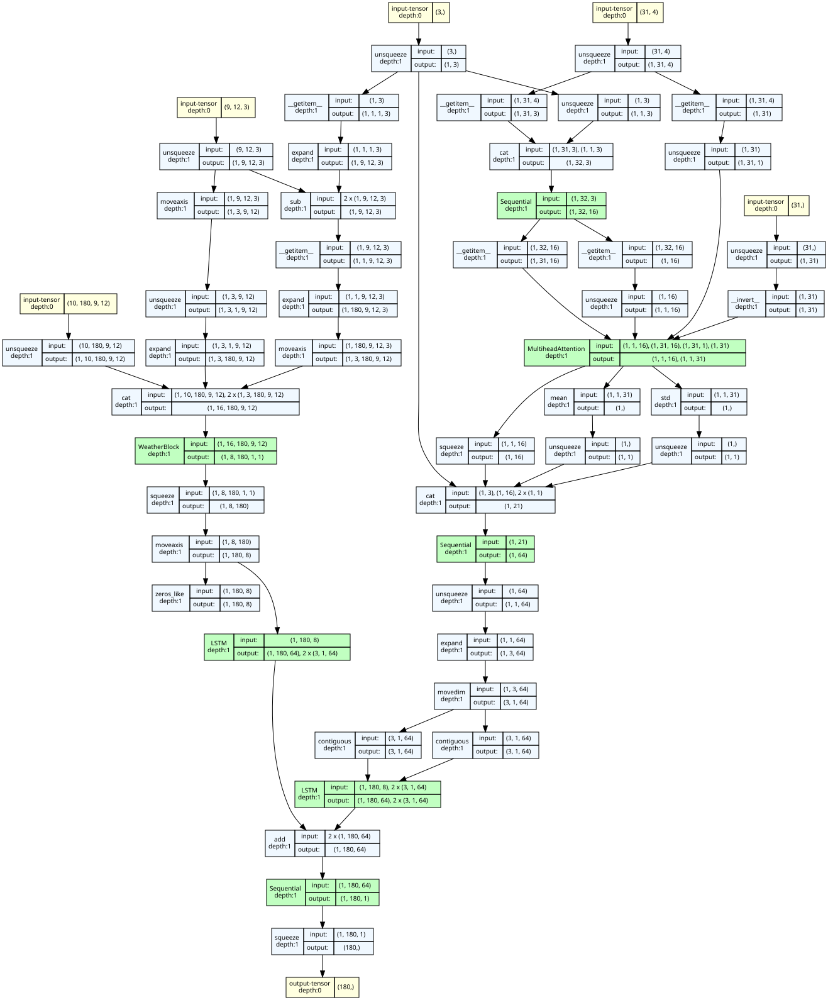

In [16]:
# [X, Z, W, Y, X_mask, Y_mask]
draw_graph(model, input_data=(ds[0][0], ds[0][1], [ds[0][2], ds.get_weather_coords(dtm = True)], ds[0][4]), depth = 1, device=device).visual_graph

In [20]:
from models.load_models_2d_refactoring import *
model_2d = Discrete2DConvLSTM(180)
dict_files["test_split_p"] = 0.2

In [21]:
ds_2d = DiscreteDataset(dict_files)

Rasterizing wtd dataframe...
Rasterized wtd dataframe.
Creating piezometric head dataset...
Piezometric head dataset created.
Value mean: 295.29437255859375
Value std: 72.11563110351562
Normalization: ON


In [22]:
dtm_2d = torch.from_numpy(ds_2d.dtm_roi_downsampled.values)

In [23]:
X = (ds_2d[0][0].unsqueeze(0), dtm_2d, ds_2d[0][1].unsqueeze(0))

In [24]:
model_2d(X)

tensor([[[[[ 0.1785, -0.3973, -0.5154,  ...,  0.1433,  0.1009,  0.0661],
           [ 0.7606,  0.0847,  0.4823,  ...,  0.0636,  0.2275, -0.0395],
           [ 0.7821,  0.0046, -0.4415,  ...,  0.0145,  0.1622, -0.1030],
           ...,
           [ 0.6202,  0.0376,  0.0274,  ...,  0.1530,  0.3227, -0.0436],
           [ 0.4009,  0.0036,  0.0125,  ...,  0.0573,  0.1070, -0.0234],
           [ 0.4461,  0.1169,  0.3267,  ...,  0.6242,  0.6443,  0.1840]],

          [[ 0.2967, -0.7823, -0.6140,  ...,  0.2027,  0.1320,  0.1077],
           [ 0.7538,  0.0915,  0.2929,  ...,  0.1416,  0.2888, -0.0884],
           [ 0.8513, -0.0403, -0.6477,  ...,  0.0768,  0.2367, -0.1466],
           ...,
           [ 0.6443,  0.0257,  0.0525,  ...,  0.2504,  0.2758, -0.0704],
           [ 0.5693,  0.0086,  0.0294,  ...,  0.3182,  0.2237, -0.0271],
           [ 0.5282,  0.0672,  0.2248,  ...,  0.5917,  0.4035,  0.1348]],

          [[ 0.3089, -0.8220, -0.5775,  ...,  0.2473,  0.1591,  0.1251],
           [ 0.

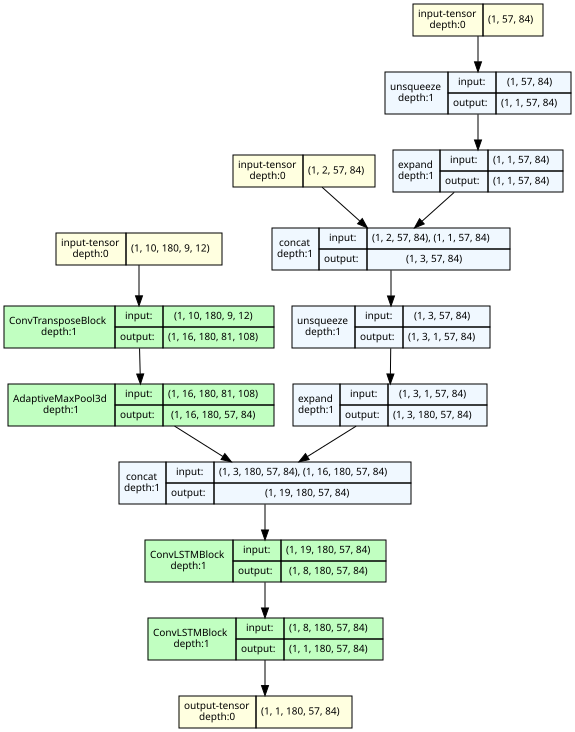

In [25]:
draw_graph(model_2d, input_data=[X], device=device, depth = 1).visual_graph

In [74]:
from loss.losses_1d import *

In [ ]:
feedforward_dloss_pdeloss(model, (x = x, z, w, x_mask),
                        groundtruth,
                        g,
                        k_lat,
                        k_lon,
                        S_y,
                        num_cpoints,
                        ds,
                        device,
                        coeff_loss_data,
                        coeff_loss_pde,
                        loss_prefix_name,
                        require_grad = True)

In [73]:
cpoint_generation(minX = ds.dtm_roi.x.min().values, maxX = ds.dtm_roi.x.max().values,
                                                minY = ds.dtm_roi.y.min().values, maxY = ds.dtm_roi.y.max().values,
                                                dtm = (ds.dtm_roi *ds.norm_factors["dtm_std"]) + ds.norm_factors["dtm_mean"],
                                                mode = "urandom",
                                                num_lon_point = 1,
                                                num_lat_point = 1).shape

(1, 3)

In [9]:
x_rand = np.random.uniform(low=0.0, high=1.0, size=4)
print(x_rand)
y_rand = np.random.uniform(low=1., high=2., size=4)
print(y_rand)

X, Y = np.meshgrid(x_rand, y_rand)
cpoints = np.stack([x_rand, y_rand], axis = -1)
cpoints.shape

[0.64666462 0.56151517 0.07452536 0.0900295 ]
[1.92180981 1.27276869 1.30072891 1.41829028]


(4, 2)

In [18]:
cpoints.shape

(12, 2)

In [ ]:
x = np.linspace(minX, maxX, num_lon_point)
        y = np.linspace(minY, maxY, num_lat_point)[::-1]
        # create the mesh based on these arrays
        X, Y = np.meshgrid(x, y)

In [38]:
prova_keys = torch.tensor([[[[0], [1], [2]],
                         [[0], [1], [2]],
                         [[0], [1], [2]],
                         [[0], [1], [2]]],
                           [[[0], [1], [2]],
                         [[0], [1], [2]],
                         [[0], [1], [2]],
                         [[0], [1], [2]]]]).to(torch.float32)

print(prova_keys.shape)
print("flattened keys", prova_keys.flatten(1, -2).shape)

prova_queries = torch.tensor([[[[0], [1]],
                         [[0], [1]]],
                              [[[0], [1]],
                         [[0], [1]]]]).to(torch.float32)

print(prova_queries.shape)
print("flattened queries", prova_queries.flatten(1, -2).shape)

torch.Size([2, 4, 3, 1])
flattened keys torch.Size([2, 12, 1])
torch.Size([2, 2, 2, 1])
flattened queries torch.Size([2, 4, 1])


In [39]:
multihead_attn = nn.MultiheadAttention(embed_dim = 1, num_heads = 1, batch_first=True)
attn_output, attn_output_weights = multihead_attn(prova_queries.flatten(1, -2),
                                                  prova_keys.flatten(1, -2),
                                                  prova_keys.flatten(1, -2))

In [40]:
attn_output.shape

torch.Size([2, 4, 1])

# PDE loss sketch

In [14]:
import deepxde

Using backend: pytorch
Other supported backends: tensorflow.compat.v1, tensorflow, jax, paddle.
paddle supports more examples now and is recommended.


No backend selected.
Finding available backend...
Found pytorch
Setting the default backend to "pytorch". You can change it in the ~/.deepxde/config.json file or export the DDE_BACKEND environment variable. Valid options are: tensorflow.compat.v1, tensorflow, pytorch, jax, paddle (all lowercase)


In [51]:
x = torch.tensor([[1.,2.,3.],
                  [1.,2.,4.]], requires_grad=True)
print("X:", x)
print(x.shape)

y = torch.ones_like(x)
y[:, 0] = x[:, 0] + x[:, 1] + x[:, 2] # gradients = 1 + 1 + 1 
y[:, 1] = - x[:, 0] - x[:, 1] - x[:, 2] # gradients = - 1 - 1 - 1
y[:, 2] = 2*x[:, 0] + 2*x[:, 1] + x[:, 2]**2 # gradients = 2 + 2 + 2x

print("Y:", y)
print(y.shape)

grad_mask = torch.tensor([[1,1,1],
                  [0,1,0]])

# Autograd: Compute and return the sum of gradients of outputs with respect to the inputs.
deepxde.config.set_default_autodiff("forward")
print("\nGradients - Autograd: \n", deepxde.gradients.gradients.jacobian(y.unsqueeze(1),
                                                                         x.unsqueeze(1), j = 1))

X: tensor([[1., 2., 3.],
        [1., 2., 4.]], requires_grad=True)
torch.Size([2, 3])
Y: tensor([[ 6., -6., 15.],
        [ 7., -7., 22.]], grad_fn=<CopySlices>)
torch.Size([2, 3])
Set the default automatic differentiation to forward mode.


ValueError: j=1 is not valid.

In [28]:
x = torch.tensor([[1.,2.,3.],
                  [1.,2.,4.]], requires_grad=True)
print("X:", x)
print(x.shape)

y = torch.ones_like(x)
y[:, 0] = x[:, 0] + x[:, 1] + x[:, 2] # gradients = 1 + 1 + 1 
y[:, 1] = - x[:, 0] - x[:, 1] - x[:, 2] # gradients = - 1 - 1 - 1
y[:, 2] = 2*x[:, 0] + 2*x[:, 1] + x[:, 2]**2 # gradients = 2 + 2 + 2x

print("Y:", y)
print(y.shape)

grad_mask = torch.tensor([[1,1,1],
                  [0,1,0]])


# Autograd: Compute and return the sum of gradients of outputs with respect to the inputs.
print("\nGradients - Autograd: \n", torch.autograd.grad(y, x,
                                                        grad_outputs= torch.ones_like(x))) # grad_outputs should be a sequence of length matching output containing the “vector” in vector-Jacobian product (v^T@J)

X: tensor([[1., 2., 3.],
        [1., 2., 4.]], requires_grad=True)
torch.Size([2, 3])
Y: tensor([[ 6., -6., 15.],
        [ 7., -7., 22.]], grad_fn=<CopySlices>)
torch.Size([2, 3])

Gradients - Autograd: 
 (tensor([[2., 2., 6.],
        [2., 2., 8.]]),)


In [22]:
grad_mask.shape

torch.Size([3, 4])

In [24]:
torch.eye(y.shape[-1]).shape

torch.Size([4, 4])

In [28]:
x = torch.tensor([[1.,2.,3.],
                  [1.,2.,4.]], requires_grad=True)
print("X:", x)
print(x.shape)

y = torch.ones_like(x)
y[:, 0] = x[:, 0] + x[:, 1] + x[:, 2] # gradients = 1 + 1 + 1 
y[:, 1] = - x[:, 0] - x[:, 1] - x[:, 2] # gradients = - 1 - 1 - 1
y[:, 2] = 2*x[:, 0] + 2*x[:, 1] + x[:, 2]**2 # gradients = 2 + 2 + 2x

print("Y:", y)
print(y.shape)

grad_mask = torch.tensor([[1,0,0],
                  [0,0,1]]) # only the derivatives for x_1


print("\nGradients - Autograd Masked: \n", torch.autograd.grad(y, x,
                                                        grad_outputs= grad_mask,
                                                        retain_graph=True))

# each element of output is the sum of the gradients of the input in the same poisition wrt the output 


#print("\nGradients - Backward: \n", y.backward(torch.ones_like(y)))

X: tensor([[1., 2., 3.],
        [1., 2., 4.]], requires_grad=True)
torch.Size([2, 3])
Y: tensor([[ 6., -6., 15.],
        [ 7., -7., 22.]], grad_fn=<CopySlices>)
torch.Size([2, 3])

Gradients - Autograd Masked: 
 (tensor([[1., 1., 1.],
        [2., 2., 8.]]),)


In [27]:
x = torch.tensor([1.,2.,3.], requires_grad=True)
print("X:", x)
print(x.shape)

y = torch.ones(4)

y[0] = x.sum() # gradients = 1 + 1 + 1 
y[1] = (-1*x).sum() # gradients = - 1 - 1 - 1
y[2] = (x**2).sum()
y[3] = (x**3).sum()
#y[:, 2] = 2*x[:, 0] + 2*x[:, 1] + x[:, 2]**2 # gradients = 2 + 2 + 2x

print("Y:", y)
print(y.shape)

# grad_mask =  torch.tensor([[1,0,0,0],
#                           [0,1,0,0],
#                           [0,0,1,0]]) # vector 

#grad_mask = torch.eye(y.shape[-1])

#x = x[None,:].expand(3,-1)
#y = y[None,:].expand(3,-1)
#grad_mask = grad_mask[None,:].expand(3,-1)
print("X:", x.shape)
print("Y:", y.shape)
#print("grad_mask:", grad_mask.shape)


# print("\nGradients - Autograd Masked: \n", torch.autograd.grad(y, x,
#                                                         grad_outputs = grad_mask,
#                                                         is_grads_batched=True))

def one_b_jac(y, x):
    grad_mask = torch.eye(y.shape[-1])
    return torch.autograd.grad(y, x,
                         grad_outputs = grad_mask,
                         is_grads_batched=True)
    
    

print("\nGradients - Autograd Masked: \n", one_b_jac(y, x))
    

X: tensor([1., 2., 3.], requires_grad=True)
torch.Size([3])
Y: tensor([ 6., -6., 14., 36.], grad_fn=<CopySlices>)
torch.Size([4])
X: torch.Size([3])
Y: torch.Size([4])

Gradients - Autograd Masked: 
 (tensor([[ 1.,  1.,  1.],
        [-1., -1., -1.],
        [ 2.,  4.,  6.],
        [ 3., 12., 27.]]),)


In [68]:
x = torch.stack([x for i in range(4)])
x

tensor([[1., 2., 3.],
        [1., 2., 3.],
        [1., 2., 3.],
        [1., 2., 3.]], grad_fn=<StackBackward0>)

In [105]:
prova = torch.tensor([0.,0.,0.], requires_grad=True)
print(prova.requires_grad)
print(prova[0].requires_grad)

True
True


In [75]:
x.retain_grad

<function Tensor.retain_grad>

In [111]:
x = torch.tensor([1.,2.,3.], requires_grad=True)

y = torch.ones(4)

y[0] = x.sum() # gradients = 1 + 1 + 1 
y[1] = (-1*x).sum() # gradients = - 1 - 1 - 1
y[2] = (x**2).sum()
y[3] = (x**3).sum()


x = torch.stack([x for i in range(4)])
x

y = torch.stack([y for i in range(4)])
y

print("X:", x.shape)
print("Y:", y.shape)


# def b_clone(y, x):
#     return y.clone(), x.clone()

def one_b_jac(y, x):
    y, x = y.clone().requires_grad_(), x.clone()
    print("y gr", y.requires_grad)
    grad_mask = torch.eye(y.shape[-1], requires_grad=True)
    print(grad_mask.requires_grad)
    # y.retain_grad()
    # x.retain_grad()
    j = torch.autograd.grad(y, x,
                         grad_outputs = grad_mask,
                         retain_graph= True,
                         create_graph= True,
                         is_grads_batched=True)
    print(j.shape)
    return j

batch_j_fun = torch.vmap(one_b_jac, in_dims=(0,0))
#batch_clone = torch.
# batch_j_fun = [one_b_jac(y[i,:], x[i,:]) for i in range(x.shape[0])]
print(y.requires_grad)
print(x.requires_grad)
batch_j = batch_j_fun(y, x)
print("\nGradients - Autograd Masked: \n", batch_j)

X: torch.Size([4, 3])
Y: torch.Size([4, 4])
True
True


RuntimeError: You are attempting to call Tensor.requires_grad_() (or perhaps using torch.autograd.functional.* APIs) inside of a function being transformed by a functorch transform. This is unsupported, please attempt to use the functorch transforms (e.g. grad, vjp, jacrev, jacfwd, hessian) or call requires_grad_() outside of a function being transformed instead.

In [66]:
x = torch.tensor([[1.,2.,3.],
                  [1.,2.,3.],
                  [1.,2.,3.],
                  [1.,2.,3.]], requires_grad=True)
print("X:", x)
print(x.shape)

y = torch.ones(x.shape[0],x.shape[1])

#for i in range(x.shape[0]):
y[0, 0] = torch.sum(x[0,:])  # gradients = 1 + 1 + 1 
y[0,1] = torch.sum(-1*x[0,:]) # gradients = - 1 - 1 - 1
y[0,2] = torch.sum(torch.pow(x[0,:], 2))

y[1, 0] = torch.sum(x[1,:])  # gradients = 1 + 1 + 1 
y[1,1] = torch.sum(-1*x[1,:]) # gradients = - 1 - 1 - 1
y[1,2] = torch.sum(torch.pow(x[1,:], 2))

y[2, 0] = torch.sum(x[2,:])  # gradients = 1 + 1 + 1 
y[2,1] = torch.sum(-1*x[2,:]) # gradients = - 1 - 1 - 1
y[2,2] = torch.sum(torch.pow(x[2,:], 2))

#y[:,3] = (x**3).sum()
#y[:, 2] = 2*x[:, 0] + 2*x[:, 1] + x[:, 2]**2 # gradients = 2 + 2 + 2x

y.requires_grad_()

print("Y:", y)
print(y.shape)
#print("y grad ", y.requires_grad)


# grad_mask =  torch.tensor([[1,0,0,0],
#                           [0,1,0,0],
#                           [0,0,1,0]]) # vector 

#grad_mask = torch.eye(y.shape[-1])

#x = x[None,:].expand(3,-1)
#y = y[None,:].expand(3,-1)
#grad_mask = grad_mask[None,:].expand(3,-1)
print("X:", x.shape)
print("Y:", y.shape)
#print("grad_mask:", grad_mask.shape)


# print("\nGradients - Autograd Masked: \n", torch.autograd.grad(y, x,
#                                                         grad_outputs = grad_mask,
#                                                         is_grads_batched=True))

def one_b_jac(y, x):
    grad_mask = torch.eye(y.shape[-1])
    return torch.autograd.grad(y, x,
                         grad_outputs = grad_mask,
                         retain_graph= True,
                         create_graph= True,
                         is_grads_batched=True)
    


batch_j_fun = torch.vmap(one_b_jac, in_dims=(0,0))
# batch_j_fun = [one_b_jac(y[i,:], x[i,:]) for i in range(x.shape[0])]

batch_j = batch_j_fun(y, x)
print("\nGradients - Autograd Masked: \n", batch_j)

X: tensor([[1., 2., 3.],
        [1., 2., 3.],
        [1., 2., 3.],
        [1., 2., 3.]], requires_grad=True)
torch.Size([4, 3])
Y: tensor([[ 6., -6., 14.],
        [ 6., -6., 14.],
        [ 6., -6., 14.],
        [ 1.,  1.,  1.]], grad_fn=<CopySlices>)
torch.Size([4, 3])
X: torch.Size([4, 3])
Y: torch.Size([4, 3])


RuntimeError: element 0 of tensors does not require grad and does not have a grad_fn

In [ ]:
batch_j_fun()

In [ ]:
f = lambda dict: torch.dot(dict['x'], dict['y'])
x, y = torch.randn(2, 5), torch.randn(5)
input = {'x': x, 'y': y}
batched_dot = torch.vmap(f, in_dims=({'x': 0, 'y': None},))
batched_dot(input)

In [ ]:
def one_b_jac(y, x):
    grad_mask = torch.eye(y.shape[-1])
    torch.autograd.grad(y, x,
                         grad_outputs = grad_mask,
                         is_grads_batched=True)

In [ ]:
x = torch.tensor([1.,2.,3.], requires_grad=True)
print("X:", x)
print(x.shape)

y = torch.ones(4)

y[0] = x.sum() # gradients = 1 + 1 + 1 
y[1] = (-1*x).sum() # gradients = - 1 - 1 - 1
y[2] = (x**2).sum()
y[3] = (x**3).sum()

def vjp(y, x, v):
     return torch.autograd.grad(y, x, v)
vect_vjp = torch.vmap(vjp, in_dims=0)(
                           y.unsqueeze(0).expand(y.shape[0], -1),
                           x.unsqueeze(0).expand(y.shape[0], -1),
                           torch.eye(y.shape[0]))
vect_vjp

X: tensor([1., 2., 3.], requires_grad=True)
torch.Size([3])


RuntimeError: element 0 of tensors does not require grad and does not have a grad_fn

In [ ]:
#####

In [19]:
def compute_jac(output, input):
    grad_mask = torch.eye(output.shape[-1])
    
    j = torch.autograd.grad(output, input,
                             grad_outputs = grad_mask,
                             retain_graph = True,
                             is_grads_batched=True)
    return j

In [20]:
compute_jac(y, x)

RuntimeError: If `is_grads_batched=True`, we interpret the first dimension of each grad_output as the batch dimension. The sizes of the remaining dimensions are expected to match the shape of corresponding output, but a mismatch was detected: grad_output[0] has a shape of torch.Size([]) and output[0] has a shape of torch.Size([2, 3]). If you only want some tensors in `grad_output` to be considered batched, consider using vmap.

In [15]:
z.shape

torch.Size([3])

In [ ]:
w = torch.tensor([w_0, weather_coords_batch])

In [28]:
x_mask*1.

tensor([[0., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]])

In [13]:
weather_coords = ds.get_weather_coords()
weather_dtm = ds.get_weather_dtm()
weather_coords = torch.cat([weather_coords, weather_dtm], dim = -1)
weather_coords_batch = weather_coords#.unsqueeze(0).expand(1, -1, -1, -1).requires_grad_()

x = ds[2000][0]#[None,:,:].expand(1 , -1, -1).requires_grad_()
z = ds[2000][1].requires_grad_()#[None, :].expand(1, -1).requires_grad_()
w_0 = ds[2000][2]#.unsqueeze(0).expand(1, -1, -1, -1, -1).requires_grad_()
w_1 = weather_coords_batch

x_mask = ds[2000][4]#[None, :].expand(1, -1)

target_pred = model(x = x,
      z = z,
      w_0 = w_0,
      w_1 = w_1,
      x_mask = x_mask)

target_pred

tensor([0.4154, 0.4149, 0.4114, 0.4122, 0.4138, 0.4142, 0.4097, 0.4111, 0.4167,
        0.4180, 0.4173, 0.4044, 0.4111, 0.4139, 0.4140, 0.4135, 0.4124, 0.4176,
        0.4213, 0.4176, 0.4137, 0.4152, 0.4138, 0.4121, 0.4145, 0.4150, 0.4144,
        0.4154, 0.4163, 0.4192, 0.4201, 0.4183, 0.4154, 0.4141, 0.4165, 0.4159,
        0.4150, 0.4156, 0.4162, 0.4141, 0.4154, 0.4155, 0.4142, 0.4150, 0.4130,
        0.4137, 0.4130, 0.4149, 0.4132, 0.4134, 0.4138, 0.4137, 0.4146, 0.4151,
        0.4151, 0.4153, 0.4168, 0.4152, 0.4065, 0.4110, 0.4156, 0.4111, 0.4128,
        0.4142, 0.4197, 0.4207, 0.4162, 0.4111, 0.4163, 0.4167, 0.4166, 0.4134,
        0.4175, 0.4171, 0.4139, 0.4123, 0.4135, 0.4121, 0.4148, 0.4138, 0.4151,
        0.4135, 0.4111, 0.4110, 0.4130, 0.4132, 0.4182, 0.4159, 0.4192, 0.4141,
        0.4168, 0.4157, 0.4145, 0.4123, 0.4151, 0.4143, 0.4147, 0.4172, 0.4164,
        0.4183, 0.4127, 0.4079, 0.4115, 0.4139, 0.4147, 0.4094, 0.4177, 0.4135,
        0.4100, 0.4147, 0.4165, 0.4126, 

In [14]:
jac_torch = torch.autograd.functional.jacobian(model, (x, z, w_0, w_1, x_mask*1.0))

In [15]:
v = torch.eye(target_pred.shape[0], requires_grad=True)

In [84]:
v.shape

torch.Size([180, 180])

In [15]:
jac_torch[1].shape

torch.Size([180, 3])

In [16]:
def get_vjp_1(v):
    return torch.autograd.grad(target_pred, z, v, retain_graph=True)

jvmap = torch.vmap(get_vjp_1)(v)

In [17]:
def get_vjp(target_pred, z, v):
    return torch.autograd.grad(target_pred, z, v, retain_graph=True)

jvmap_2 = torch.vmap(get_vjp, in_dims=(None,None,0))(target_pred, z, v)

In [18]:
def one_b_jac(y, x):
    grad_mask = torch.eye(y.shape[-1])
    return torch.autograd.grad(y, x,
                         grad_outputs = grad_mask,
                         retain_graph= True,
                         is_grads_batched=True)
    
jvmap_3 = one_b_jac(target_pred, z)

In [36]:
jvmap[0].shape

torch.Size([180, 3])

In [37]:
jvmap_2[0].shape

torch.Size([180, 3])

In [25]:
jvmap_3[0].shape

torch.Size([180, 3])

In [38]:
print(jvmap[0][:4, :], end = "\n\n")
print(jvmap_2[0][:4, :], end = "\n\n")
print(jvmap_3[0][:4, :], end = "\n\n")

tensor([[-8.1358e-04,  5.3469e-04, -6.3092e-04],
        [-1.7680e-04,  3.1450e-04, -1.2710e-03],
        [-7.4427e-04,  8.1707e-05, -1.7035e-04],
        [-6.9241e-04,  7.8838e-05, -2.6453e-04]])

tensor([[-8.1358e-04,  5.3469e-04, -6.3092e-04],
        [-1.7680e-04,  3.1450e-04, -1.2710e-03],
        [-7.4427e-04,  8.1707e-05, -1.7035e-04],
        [-6.9241e-04,  7.8838e-05, -2.6453e-04]])

tensor([[-8.1358e-04,  5.3469e-04, -6.3092e-04],
        [-1.7680e-04,  3.1450e-04, -1.2710e-03],
        [-7.4427e-04,  8.1707e-05, -1.7035e-04],
        [-6.9240e-04,  7.8838e-05, -2.6453e-04]])



In [62]:
v = torch.eye(180, requires_grad=True)

def one_sample_j(ds, v, sample = 2000):
    weather_coords = ds.get_weather_coords()
    weather_dtm = ds.get_weather_dtm()
    weather_coords = torch.cat([weather_coords, weather_dtm], dim = -1)
    weather_coords_batch = weather_coords#.unsqueeze(0).expand(1, -1, -1, -1).requires_grad_()

    x = ds[sample][0]#[None,:,:].expand(1 , -1, -1).requires_grad_()
    z = ds[sample][1].requires_grad_()#[None, :].expand(1, -1).requires_grad_()
    w_0 = ds[sample][2]#.unsqueeze(0).expand(1, -1, -1, -1, -1).requires_grad_()
    w_1 = weather_coords_batch

    x_mask = ds[sample][4]#[None, :].expand(1, -1)

    target_pred = model(x = x,
        z = z,
        w_0 = w_0,
        w_1 = w_1,
        x_mask = x_mask)
    
    
    
    return torch.vmap(get_vjp, in_dims=(None,None,0))(target_pred, z, v)



In [68]:
torch.tensor([[2000], [2001], [2002]]).shape

torch.Size([3, 1])

In [67]:
prova_batched = torch.vmap(one_sample_j, in_dims=(None, None, 0))(ds, v, torch.tensor([[2000], [2001], [2002]]))

RuntimeError: vmap: It looks like you're attempting to use a Tensor in some data-dependent control flow. We don't support that yet, please shout over at https://github.com/pytorch/functorch/issues/257 .

In [85]:
torch.autograd.grad(target_pred, z, v, retain_graph=True, is_grads_batched=True)

: 

In [28]:
jvmap[0][:5]

tensor([[-1.3632e-03,  4.3225e-05, -1.9305e-03],
        [-1.5241e-03,  6.3372e-04, -1.8259e-03],
        [-1.7442e-03,  8.4834e-04, -2.0200e-03],
        [-1.3158e-03,  8.8331e-04, -1.1864e-03],
        [-2.3389e-04,  1.3911e-04, -4.9732e-05]])

In [30]:
jac_torch[1][:5]

tensor([[-1.3632e-03,  4.3225e-05, -1.9305e-03],
        [-1.5241e-03,  6.3372e-04, -1.8259e-03],
        [-1.7442e-03,  8.4834e-04, -2.0200e-03],
        [-1.3158e-03,  8.8331e-04, -1.1864e-03],
        [-2.3389e-04,  1.3912e-04, -4.9733e-05]])

In [31]:
jvmap[0][10:15]

tensor([[ 7.9386e-06, -1.4021e-05, -2.4829e-05],
        [ 4.6439e-06, -1.6523e-05, -1.5785e-05],
        [ 2.4447e-09,  4.5111e-09, -1.5600e-08],
        [-9.1677e-10, -3.7544e-09,  5.3551e-09],
        [-3.9581e-09, -5.2387e-09, -6.9849e-09]])

In [32]:
jac_torch[1][10:15]

tensor([[ 7.9354e-06, -1.4023e-05, -2.4830e-05],
        [ 4.6421e-06, -1.6526e-05, -1.5783e-05],
        [ 4.1910e-09,  4.1327e-09, -1.2340e-08],
        [-1.8772e-09, -4.8894e-09,  6.5193e-09],
        [-9.0804e-09, -6.4028e-09, -6.5193e-09]])

### batched

In [53]:
nbatch = 2
weather_coords = ds.get_weather_coords()
weather_dtm = ds.get_weather_dtm()
weather_coords = torch.cat([weather_coords, weather_dtm], dim = -1)
#weather_coords_batch = weather_coords.unsqueeze(0).expand(nbatch, -1, -1, -1).requires_grad_()

x = torch.stack([ds[2000 + i][0] for i in range(nbatch)])
z = torch.stack([ds[2000 + i][1] for i in range(nbatch)]).requires_grad_() #.expand(nbatch, -1).requires_grad_()
w_0 = torch.stack([ds[2000 + i][2] for i in range(nbatch)])
w_1 = torch.stack([weather_coords for i in range(nbatch)])

x_mask = torch.stack([ds[2000 + i][4] for i in range(nbatch)]) #[None, :].expand(nbatch, -1)

target_pred = model(x = x,
      z = z,
      w = [w_0, w_1],
      x_mask = x_mask)

target_pred = target_pred.requires_grad_()

In [76]:
# Gradient computation with autograd - more efficient
def jacobian_batches(output, input):
    
    grad_outputs = torch.eye(output.shape[-1])[:,None,:].expand(-1, output.shape[0], -1)
    return torch.autograd.grad(output, input, grad_outputs = grad_outputs,
                               create_graph  = True,
                               retain_graph=True,
                               is_grads_batched=True)

In [77]:
target_pred.shape

torch.Size([2, 180])

In [81]:
target_pred_cut = target_pred[:, :15]
target_pred_cut

tensor([[-0.9310, -0.9536, -0.9591, -0.9559, -0.9684, -0.9795, -0.9898, -0.9909,
         -0.9940, -0.9932, -0.9863, -0.9913, -0.9850, -0.9792, -0.9880],
        [-0.4153, -0.5145, -0.6534, -0.6446, -0.6477, -0.6587, -0.6623, -0.6652,
         -0.6688, -0.6710, -0.6724, -0.6736, -0.6721, -0.6745, -0.6740]],
       grad_fn=<SliceBackward0>)

In [82]:
autograd_jac = jacobian_batches(output = target_pred_cut,
                 input = z)

In [83]:
autograd_jac[0].shape

torch.Size([15, 2, 3])

In [19]:
target_pred.shape

torch.Size([2, 180])

In [39]:
a = 0
def prova_print(a = a):
    for i in range(a, 5):
        print(i)

In [40]:
prova_print()

0
1
2
3
4


In [15]:
# Gradient computation with backward and for loop

def grad_bk_loop(y, x, nbatch, y_features_start, y_features_end):
    gradients_bk = []
    for b in range(nbatch):
        b_grad = []
        for i in range(y_features_start, y_features_end):
            y[b,i].backward(retain_graph=True)
            b_grad.append(x.grad[b,:].clone())
            x.grad.zero_() 
        gradients_bk.append(b_grad)
    
    return gradients_bk      

# Use y_features in grad_output
def grad_bk_loop_alt(y, x, nbatch, y_features):
    gradients_bk = []
    for b in range(nbatch):
        b_grad = []
        for i in range(y_features):
            grad_output = torch.zeros(180)
            grad_output[i] = 1
            y[b,:].backward(grad_output, retain_graph=True)
            b_grad.append(x.grad[b,:].clone())
            x.grad.zero_() 
        gradients_bk.append(b_grad)
    
    return gradients_bk  

# Use both batches and y_features in grad_output
def grad_bk_loop_alt_2(y, x, nbatch, y_features):
    gradients_bk = []
    for b in range(nbatch):
        b_grad = []
        batch_mask = torch.zeros(nbatch)
        batch_mask[b] = 1 
        for i in range(y_features):
            y_features_mask = torch.zeros(180)
            y_features_mask[i] = 1
            grad_output = batch_mask[:,None].expand(-1,180) * y_features_mask[None,:].expand(nbatch,-1)
            y.backward(grad_output, retain_graph=True)
            b_grad.append(x.grad[b,:].clone())
            x.grad.zero_() 
        gradients_bk.append(b_grad)
    
    return gradients_bk 

In [29]:
x.shape

torch.Size([2, 31, 4])

In [52]:
int(0.75)

0

In [61]:
prova = {"a":1, "b":0}
print({k:prova[k] for k in list(prova)})

{'a': 1, 'b': 0}


In [30]:
nbatch = 2
weather_coords = ds.get_weather_coords()
weather_dtm = ds.get_weather_dtm()
weather_coords = torch.cat([weather_coords, weather_dtm], dim = -1)
#weather_coords_batch = weather_coords.unsqueeze(0).expand(nbatch, -1, -1, -1).requires_grad_()

x = ds[2000][0].unsqueeze(0).expand(nbatch, -1, -1)
z = ds[2000][1].unsqueeze(0).expand(nbatch, -1,).requires_grad_() #.expand(nbatch, -1).requires_grad_()
w_0 = ds[2000][2].unsqueeze(0).expand(nbatch, -1, -1, -1, -1)
w_1 = weather_coords.unsqueeze(0).expand(nbatch, -1, -1, -1,)

x_mask = ds[2000][4].unsqueeze(0).expand(nbatch, -1) #[None, :].expand(nbatch, -1)

target_pred = model(x = x,
      z = z,
      w = [w_0, w_1],
      x_mask = x_mask)

target_pred = target_pred.requires_grad_()

In [31]:
grad_backward_loop = grad_bk_loop(target_pred, z, nbatch, 170 , 180)

print("Gradien backprop loop: ")

for i in range(10):
        for b in range(nbatch):
            print(grad_backward_loop[b][i])
        print("\n")

Gradien backprop loop: 
tensor([-0.3778, -0.1232,  0.4385])
tensor([-0.3778, -0.1232,  0.4385])


tensor([-0.3860, -0.0612,  0.4535])
tensor([-0.3860, -0.0612,  0.4535])


tensor([-0.3926, -0.0277,  0.4556])
tensor([-0.3926, -0.0277,  0.4556])


tensor([-0.4140, -0.0073,  0.4645])
tensor([-0.4140, -0.0073,  0.4645])


tensor([-0.4000, -0.0412,  0.4420])
tensor([-0.4000, -0.0412,  0.4420])


tensor([-0.3525, -0.0995,  0.4042])
tensor([-0.3525, -0.0995,  0.4042])


tensor([-0.3539, -0.1164,  0.4164])
tensor([-0.3539, -0.1164,  0.4164])


tensor([-0.3150, -0.1499,  0.3982])
tensor([-0.3150, -0.1499,  0.3982])


tensor([-0.3100, -0.1216,  0.4113])
tensor([-0.3100, -0.1216,  0.4113])


tensor([-0.3758, -0.0512,  0.4736])
tensor([-0.3758, -0.0512,  0.4736])




In [15]:
autograd_jac[0][170:180,:,:]

tensor([[[-0.3778, -0.1232,  0.4385],
         [-0.2297, -0.6691,  0.5630]],

        [[-0.3860, -0.0612,  0.4535],
         [-0.2545, -0.6621,  0.5950]],

        [[-0.3926, -0.0277,  0.4556],
         [-0.2574, -0.6249,  0.5859]],

        [[-0.4140, -0.0073,  0.4645],
         [-0.2677, -0.6004,  0.5762]],

        [[-0.4000, -0.0412,  0.4420],
         [-0.2356, -0.5882,  0.5517]],

        [[-0.3525, -0.0995,  0.4042],
         [-0.1997, -0.5981,  0.5258]],

        [[-0.3539, -0.1164,  0.4164],
         [-0.1321, -0.6284,  0.4986]],

        [[-0.3150, -0.1499,  0.3982],
         [-0.0807, -0.6613,  0.4775]],

        [[-0.3100, -0.1216,  0.4113],
         [-0.0607, -0.6785,  0.4769]],

        [[-0.3758, -0.0512,  0.4736],
         [-0.0703, -0.6622,  0.4778]]], grad_fn=<SliceBackward0>)

## pde block

In [12]:
def masked_mse(y_hat, y, mask):
    # y_hat = y_hat.to(device)
    # y = y.to(device)
    # mask = mask.to(device)
    return torch.sum(((y_hat[mask]-y[mask]))**2.0)  / torch.sum(mask)

In [ ]:
np.ra

In [22]:
x[torch.randint(0,1, (1,)), :, :].shape

torch.Size([1, 31, 4])

In [20]:
x.shape

torch.Size([2, 31, 4])

In [17]:
# JACOBIANA CALCOLATA ANCHE PER DTM!!! EFFICIENTA! 

# Gradient computation with autograd - more efficient
def jacobian_batches(output, input):
    
    grad_outputs = torch.eye(output.shape[-1])[:,None,:].expand(-1, output.shape[0], -1)
    return torch.autograd.grad(output, input, grad_outputs = grad_outputs,
                               create_graph  = True,
                               retain_graph=True,
                               is_grads_batched=True)

def physics_loss(y_hat, coord_input, g = torch.tensor([0]),
                 k_lat = torch.tensor([1]),
                 k_lon = torch.tensor([1]),
                 S_y = torch.tensor([1])):
    # compute gradients
    jacobian_lat_lon_dtm = jacobian_batches(output = y_hat,
                 input = coord_input)[0]
    print("firs J computed")
    h_dlat = torch.moveaxis(jacobian_lat_lon_dtm[:,:,0], 0, 1)
    h_dlat = -(h_dlat * y_hat) * k_lat
    print("h_dlat", h_dlat[:,:3])
    print("h_dlat", h_dlat.shape)
    h_dlon = torch.moveaxis(jacobian_lat_lon_dtm[:,:,1], 0, 1)
    h_dlon = -(h_dlon * y_hat) * k_lon
    print("h_dlon", h_dlon[:,:3])
    
    h_d2lat = jacobian_batches(output = h_dlat,
                 input = coord_input)[0][:,:,0]
    h_d2lat = torch.moveaxis(h_d2lat, 0, 1)
    print("firs J computed")
    h_d2lon = jacobian_batches(output = h_dlon,
                 input = coord_input)[0][:,:,1]
    h_d2lon = torch.moveaxis(h_d2lon, 0, 1)

    h_dt = y_hat[:,1:] - y_hat[:,:-1] # first diff
    
    pde_res = (S_y * h_dt) + h_d2lat + h_d2lon - g
    loss_pde = torch.sum(pde_res**2)
    
    return loss_pde

In [50]:
dict_prova = {"a":1, "b":2}
print("prova", end = ": ")
print(dict_prova)

prova: {'a': 1, 'b': 2}


In [49]:
list(dict_prova)

['a', 'b']

In [48]:
dict_prova[list(dict_prova)[-1]]

2

In [18]:
physics_loss(target_pred, z, g = torch.tensor([0]),
                 k_lat = torch.tensor([1]),
                 k_lon = torch.tensor([1]),
                 S_y = torch.tensor([1]))

firs J computed
h_dlat tensor([[-0.3730, -0.4271, -0.5083],
        [-0.1912, -0.2462, -0.1097]], grad_fn=<SliceBackward0>)
h_dlat torch.Size([2, 180])
h_dlon tensor([[-0.3810, -0.2419, -0.1042],
        [-0.4540, -0.3642, -0.2947]], grad_fn=<SliceBackward0>)


: 

# Training

In [8]:
batch_size = dict_files["batch_size"]
max_epochs = dict_files["epochs"]

test_split_p = dict_files["test_split_p"]
train_split_p = 1 - test_split_p

max_ds_elems = ds.__len__()
if not dict_files["all_dataset"]:
    max_ds_elems = dict_files["max_ds_elems"]

train_idx = int(max_ds_elems*train_split_p)
test_idx = int(max_ds_elems*test_split_p)

print(f"Traing size: {train_idx}, Test size: {test_idx}")

train_idxs, test_idxs = np.arange(train_idx), np.arange(train_idx, train_idx + test_idx)

train_sampler = SequentialSampler(train_idxs)
test_sampler = SequentialSampler(test_idxs)

train_loader = torch.utils.data.DataLoader(dataset=ds,
                                            batch_size=batch_size,
                                            sampler=train_sampler)

test_loader = torch.utils.data.DataLoader(dataset=ds,
                                            batch_size=batch_size,
                                            sampler=test_sampler)

Traing size: 203856, Test size: 50964


In [39]:
def plot_predictions(x, y, y_hat, save_dir = None, title = None):
    fig, ax = plt.subplots()
    fig.suptitle("Loss vs iterations")
    ax.plot(x, y_hat, label = "predicted")
    ax.plot(x, y, label = "true")
    ax.legend()
    
    if title is not None:
        ax.set_title(title)
        
    if save_dir:
        plt.savefig(f"{save_dir}.png", bbox_inches = 'tight') #dpi = 400, transparent = True
    
    return fig

In [10]:
def masked_mse(y_hat, y, mask):
    # y_hat = y_hat.to(device)
    # y = y.to(device)
    # mask = mask.to(device)
    return torch.sum(((y_hat[mask]-y[mask]))**2.0)  / torch.sum(mask)

In [12]:
optimizer = torch.optim.Adam(model.parameters(), lr=5e-4)

In [13]:
wandb.init(
    entity="gsartor-unito",
    project=dict_files["experiment_name"],
    dir =dict_files["wandb_dir"],
    config=dict_files,
    mode="offline",
)

# Magic
wandb.watch(model, log_freq=100)

wandb: Using wandb-core as the SDK backend. Please refer to https://wandb.me/wandb-core for more information.


In [112]:
import random

In [41]:
def cpoint_generation(minX, maxX, minY, maxY, dtm,
                      mode = "even",
                      num_lon_point = 100,
                      num_lat_point = 100):
    
    if mode == "even":
        
        # create one-dimensional arrays for x and y
        x = np.linspace(minX, maxX, num_lon_point)
        y = np.linspace(minY, maxY, num_lat_point)
        # create the mesh based on these arrays
        X, Y = np.meshgrid(x, y)
        coords = np.stack([Y, X], axis = -1)
        
        
    dtm_xy = dtm.sel(x = x, y = y,
                     method = "nearest").values
    
    coords = np.concat([coords, np.moveaxis(dtm_xy, 0, -1)], axis=-1)
    coords = coords.reshape(coords.shape[0]*coords.shape[1], coords.shape[2])
        
    return coords

In [132]:
X.shape

(10, 10)

In [150]:
prova = cpoint_generation(minX = ds.dtm_roi.x.min().values, maxX = ds.dtm_roi.x.max().values,
                                                minY = ds.dtm_roi.y.min().values, maxY = ds.dtm_roi.y.max().values,
                                                dtm = ds.dtm_roi,
                                                num_lon_point = 3,
                                                num_lat_point = 2)

print(prova)
print(prova.shape)

[[44.31083333  6.62666667  0.86661679]
 [44.31083333  7.32791667 -0.48569936]
 [44.31083333  8.02916667 -0.44796762]
 [45.265       6.62666667  2.29029632]
 [45.265       7.32791667  0.46968988]
 [45.265       8.02916667 -1.05911243]]
(6, 3)


In [ ]:
def pde_loss_1d():
    return

In [ ]:
long_cpoint, lat_cpoint = cpoint_generation(ds.dtm_roi.x.min().values, ds.dtm_roi.x.max().values,
                  ds.dtm_roi.y.min().values, ds.dtm_roi.y.max().values,
                  mode = "even")

mem allocated in MB:  0.0
############### Training epoch 0 ###############


  0%|          | 0/250 [00:00<?, ?batch/s]

Epoch 0:   0%|          | 0/250 [00:02<?, ?batch/s]

Train loss: 425.80499267578125


Epoch 0:   0%|          | 1/250 [00:11<35:03,  8.45s/batch]

Train loss: 480.5107116699219


Epoch 0:   0%|          | 1/250 [00:16<1:09:58, 16.86s/batch]


############### Test epoch 0 ###############


Epoch 0:   2%|▏         | 1/63 [00:04<04:44,  4.59s/batch]

Test loss: 425.613525390625


Epoch 0:   2%|▏         | 1/63 [00:09<09:36,  9.29s/batch]


Test loss: 480.4068298339844
############### Training epoch 1 ###############


  0%|          | 0/250 [00:01<?, ?batch/s]


KeyboardInterrupt: 

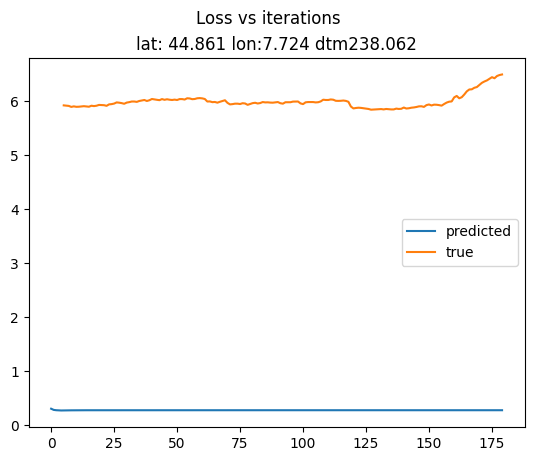

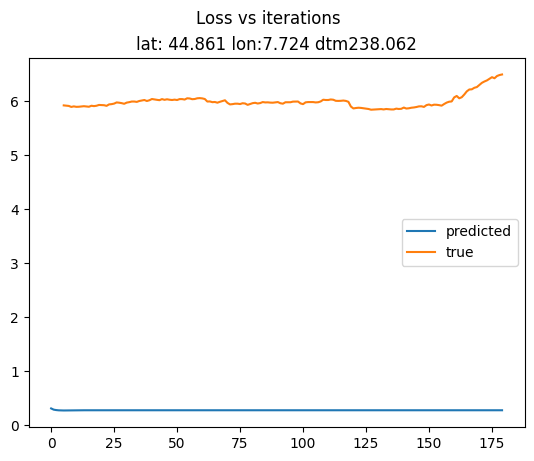

In [17]:
timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

weather_coords = ds.get_weather_coords()
weather_dtm = ds.get_weather_dtm()
weather_coords = torch.cat([weather_coords, weather_dtm], dim = -1)

print('mem allocated in MB: ', torch.cuda.memory_allocated() / 1024**2)
#print(torch.cuda.memory_summary(device=None, abbreviated=False))

for i in range(max_epochs):
    
    model.train(True)
    start_time = time.time()
    print(f"############### Training epoch {i} ###############")
    
    with tqdm(train_loader, unit="batch") as tepoch:
            for batch_idx, (x, z, w_values, y, x_mask, y_mask) in enumerate(tepoch):
                tepoch.set_description(f"Epoch {i}")
                
                x = x.to(device)
                x_mask = x_mask.to(device)
                z = z.to(device)
                weather_coords_batch = weather_coords.unsqueeze(0).expand(w_values.shape[0], -1, -1, -1)
                w = [w_values.to(device), weather_coords_batch.to(device)]
                y = y.to(device)
                y_mask = y_mask.to(device)
                
                optimizer.zero_grad()
                
                y_hat = model(x, z, w, x_mask)
                
                loss_data = masked_mse(y_hat,
                                  y,
                                  y_mask)
                
                print(f"Train data-loss: {loss}")
                
                # Control point generation
                time_cpoint = random.sample(range(x.shape[0]), 10)
                for aug_date_idx in range(len(time_cpoint)):
                    
                    x_cpoint = x[time_cpoint[aug_date_idx],:,:].expand(100,-1,-1)
                    x_mask_cpoint = x_mask[time_cpoint[aug_date_idx],:].expand(100,-1)
                    
                    z_cpoint = cpoint_generation(minX = ds.dtm_roi.x.min().values, maxX = ds.dtm_roi.x.max().values,
                                                minY = ds.dtm_roi.y.min().values, maxY = ds.dtm_roi.y.max().values,
                                                dtm = ds.dtm_roi,
                                                num_lon_point = 10,
                                                num_lat_point = 10)
                    
                    z_cpoint = torch.tensor(z_cpoint).to(device)
                    w_cpoint = w[time_cpoint[aug_date_idx],:,:,:,:].expand(100,-1,-1,-1,-1)
                
                    y_hat_cpoint = model(x_cpoint, z_cpoint, w_cpoint, x_mask_cpoint)
                    y_hat = torch.cat([y_hat, y_hat_cpoint], dim = 0)
                
                loss_pde = pde_loss_1d(y_hat)
                
                loss = loss_data + loss_pde
                    
                loss.backward()
                optimizer.step()
                
                metrics = {
                    "train_loss" : loss
                }
                wandb.log(metrics) 
                
                if batch_idx == 1:
                    break             
                
    end_time = time.time()
    exec_time = end_time-start_time

    wandb.log({"tr_epoch_exec_t" : exec_time})
    # Log the plot
    lat_plot = round(float(z[-1,0].detach().cpu()), 4)
    lon_plot = round(float(z[-1,1].detach().cpu()), 4)
    dtm_plot = round(float(z[-1,2].detach().cpu()))
    wandb.log({"training_pred":wandb.Image(plot_predictions(np.arange(0,dict_files["timesteps"]),
                                                 y[-1,:].detach().cpu(), y_hat[-1,:].detach().cpu(),
                                        title = f"lat: {lat_plot} lon:{lon_plot} dtm:{dtm_plot}"))
               })

    model_name = 'model_{}_{}.pt'.format(timestamp, i)    
    model_dir = dict_files["save_model_dir"]
    torch.save(model.state_dict(), f"{model_dir}/{model_name}") 

    print(f"############### Test epoch {i} ###############")
    # Set the model to evaluation mode, disabling dropout and using population
    # statistics for batch normalization.
    model.eval()
    start_time = time.time()
    # Disable gradient computation and reduce memory consumption.
    with torch.no_grad():
        with tqdm(test_loader, unit="batch") as tepoch:
                for batch_idx, (x, z, w_values, y, x_mask, y_mask) in enumerate(tepoch):
                    tepoch.set_description(f"Epoch {i}")

                    x = x.to(device)
                    x_mask = x_mask.to(device)
                    z = z.to(device)
                    weather_coords_batch = weather_coords.unsqueeze(0).expand(w_values.shape[0], -1, -1, -1)
                    w = [w_values.to(device), weather_coords_batch.to(device)]
                    y = y.to(device)
                    y_mask = y_mask.to(device)
                    # print('Batch mem allocated in MB: ', torch.cuda.memory_allocated() / 1024**2)

                    y_hat = model(x, z, w, x_mask)
                    # print('After predict mem allocated in MB: ', torch.cuda.memory_allocated() / 1024**2)

                    loss = masked_mse(y_hat,
                                  y,
                                  y_mask)
                    print(f"Test loss: {loss}")

                    metrics = {
                        "test_loss" : loss
                    }

                    wandb.log(metrics)
                    
                    if batch_idx == 1:
                        break  
        
    end_time = time.time()
    exec_time = end_time-start_time
    wandb.log({"test_epoch_exec_t" : exec_time})
    # Log the plot
    lat_plot = round(float(z[-1,0].detach().cpu()), 4)
    lon_plot = round(float(z[-1,1].detach().cpu()), 4)
    dtm_plot = round(float(z[-1,2].detach().cpu()))
    wandb.log({"test_pred": wandb.Image(plot_predictions(np.arange(0,dict_files["timesteps"]), y[-1,:].detach().cpu(), y_hat[-1,:].detach().cpu(),
                                        title = f"lat: {lat_plot} lon:{lon_plot} dtm:{dtm_plot}"))
               })


wandb.finish()

print(f"Execution time: {end_time-start_time}s")

# Physics loss

In [ ]:
# grad function

In [11]:
def physics_loss(model: torch.nn.Module):
    control_points_x_ode = torch.linspace(-100, 100, steps=1000,).view(-1,1).requires_grad_(True).to(DEVICE)
    control_points_y_ode = model(control_points_x_ode)
    ode_est = grad(control_points_y_ode, control_points_x_ode)[0]
    pde = 2*control_points_x_ode - ode_est
    
    # Metti temporal encoding in input? 
    pde = 
    pde_res = 
    
    return torch.mean(pde**2)

SyntaxError: invalid syntax (2927248471.py, line 8)

# Test plots

In [17]:
batch_size = dict_files["batch_size"]
max_epochs = dict_files["epochs"]

max_ds_elems = ds.__len__()
if not dict_files["all_dataset"]:
    max_ds_elems = dict_files["max_ds_elems"]
    
if type(dict_files["test_split_p"]) is str:
    
    train_idx = int(ds.get_iloc_from_date(date_max= np.datetime64(dict_files["test_split_p"])))
    test_idx = int(max_ds_elems - train_idx)
else:
    test_split_p = dict_files["test_split_p"]
    train_split_p = 1 - test_split_p
    
    train_idx = int(max_ds_elems*train_split_p)
    test_idx = int(max_ds_elems*test_split_p)

train_idxs, test_idxs = np.arange(train_idx), np.arange(train_idx,
                                                        train_idx + test_idx)

print(f"Traing size: {train_idx} - {ds.wtd_df.index.get_level_values(0)[train_idxs[-1]]}, Test size: {test_idx} - {ds.wtd_df.index.get_level_values(0)[test_idxs[-1]]}")

# Sampler 
if dict_files["random_sampler"] is True:
    train_sampler = RandomSampler(train_idxs)
else:
    train_sampler = SequentialSampler(train_idxs)
    
test_sampler = SequentialSampler(test_idxs)

train_loader = torch.utils.data.DataLoader(dataset=ds,
                                            batch_size=31,
                                            sampler=train_sampler)

test_loader = torch.utils.data.DataLoader(dataset=ds,
                                            batch_size=31,
                                            sampler=test_sampler)

Traing size: 192478 - 2017-12-31 00:00:00, Test size: 62342 - 2023-07-04 00:00:00


In [13]:
model_path = "/leonardo_scratch/fast/IscrC_DL4EO/results/continuous_1d/models/model_20250116_115800.pt"
model.load_state_dict(torch.load(model_path, weights_only=True, map_location=torch.device('cpu')))
model.eval()

Continuous1DNN_idw(
  (cb_fc): Sequential(
    (0): Linear(in_features=5, out_features=64, bias=True)
    (1): LeakyReLU(negative_slope=0.01)
    (2): Linear(in_features=64, out_features=64, bias=True)
    (3): LeakyReLU(negative_slope=0.01)
    (4): Linear(in_features=64, out_features=64, bias=True)
    (5): LeakyReLU(negative_slope=0.01)
    (6): Linear(in_features=64, out_features=64, bias=True)
    (7): Tanh()
  )
  (conv3d_stack): Sequential(
    (0): Conv3d(16, 64, kernel_size=(1, 2, 2), stride=(1, 1, 1))
    (1): BatchNorm3d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.01)
    (3): Conv3d(64, 64, kernel_size=(1, 2, 2), stride=(1, 1, 1))
    (4): BatchNorm3d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): LeakyReLU(negative_slope=0.01)
    (6): Conv3d(64, 64, kernel_size=(1, 2, 2), stride=(1, 1, 1))
    (7): BatchNorm3d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8

In [14]:
def masked_mse(y_hat, y, mask):
    return torch.sum(((y_hat[mask]-y[mask]))**2.0)  / torch.sum(mask)

def masked_mae(y_hat, y, mask):
    return torch.sum(torch.abs((y_hat[mask]-y[mask])))  / torch.sum(mask)

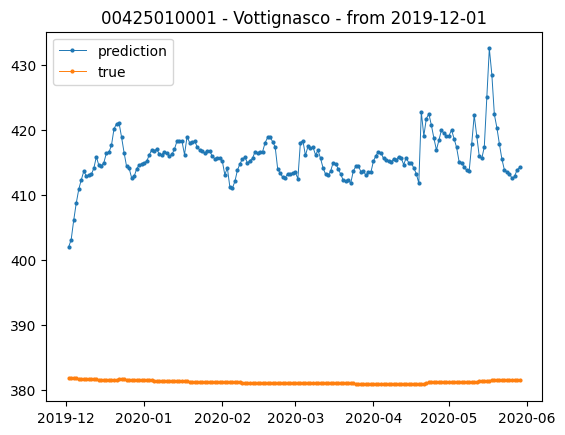

In [ ]:
plot_one_series(ds = ds, date_t0=np.datetime64("2019-12-01"), sensor=15, model = model, device = device,
                  print_plot = True)

In [22]:
sample_h, sample_wtd, dtm_denorm_downsampled = predict_map_points(ds, lon_point = 30, 
                 sample_date = np.datetime64("2019-12-01"),
                 model = model, device = device)

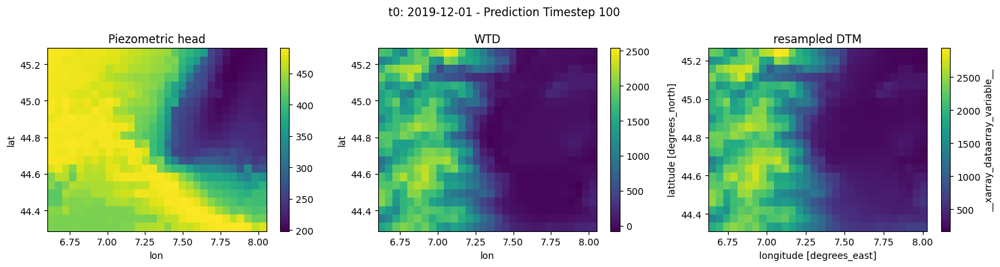

In [30]:
plot_one_map(sample_h, sample_wtd, dtm_denorm_downsampled, 
                 np.datetime64("2019-12-01"), pred_timestep = 100,
                 save_dir = None, 
                 print_plot = True)

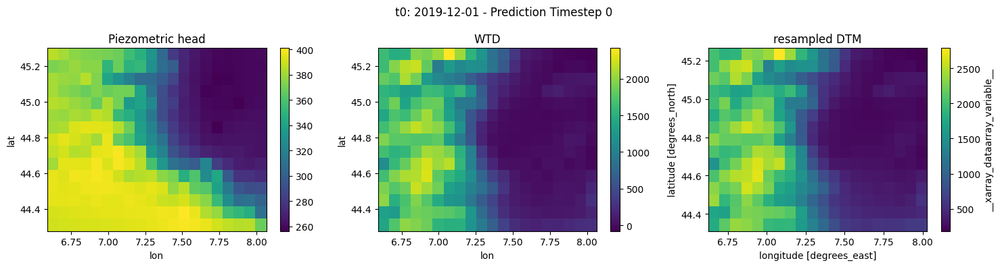

In [16]:
plot_one_map(ds = ds, sample_idx = 0,
             lon_point = 20, 
             sample_date = np.datetime64("2019-12-01"),
             pred_timestep = 50,
             model = model,
             device = device,
             save_dir = None, 
             print_plot = True)

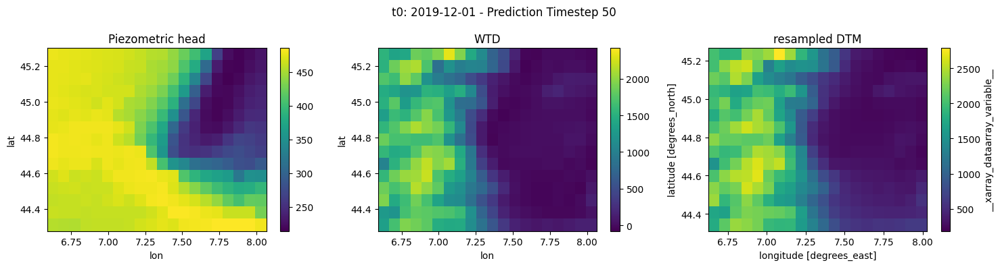

In [17]:
plot_one_map(ds = ds, sample_idx = 0,
             lon_point = 20, 
             sample_date = np.datetime64("2019-12-01"),
             pred_timestep = 50,
             model = model,
             device = device,
             save_dir = None, 
             print_plot = True)

In [14]:
weather_coords = ds.get_weather_coords()
weather_dtm = ds.get_weather_dtm()
weather_coords = torch.cat([weather_coords, weather_dtm], dim = -1)

y_list = []
y_hat_list = []
mse_list = []
mae_list = []

with tqdm(test_loader, unit="batch") as tepoch:
                for batch_idx, (x, z, w_values, y, x_mask, y_mask) in enumerate(tepoch):
                    #tepoch.set_description(f"Epoch {i}")

                    x = x.to(device)
                    x_mask = x_mask.to(device)
                    z = z.to(device)
                    weather_coords_batch = weather_coords.unsqueeze(0).expand(w_values.shape[0], -1, -1, -1)
                    w = [w_values.to(device), weather_coords_batch.to(device)]
                    y = y.to(device)
                    y_mask = y_mask.to(device)
                    
                    y_hat = model(x, z, w, x_mask)
                    # denormalize 
                    y_hat = (y_hat * ds.norm_factors["target_std"]) + ds.norm_factors["target_mean"]
                    y = (y * ds.norm_factors["target_std"]) + ds.norm_factors["target_mean"]
                    
                    y_list.append(y)
                    y_hat_list.append(y_hat)

                    mse = masked_mse(y_hat,
                                  y,
                                  y_mask)
                    mse_list.append(mse)
                    
                    mae = masked_mae(y_hat,
                                  y,
                                  y_mask)
                    mae_list.append(mae)
                    
                    if batch_idx == 5:
                        break

  0%|          | 5/2012 [00:14<1:39:02,  2.96s/batch]


In [15]:
sample_day = 0

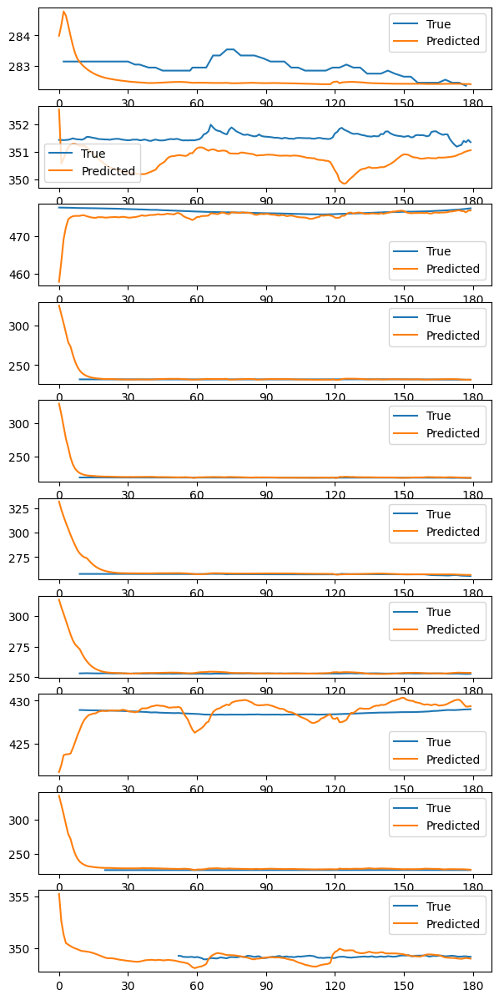

In [16]:
fig, ax = plt.subplots(10, figsize = (7,15))
for i in range(10):
        y = y_list[sample_day][i, :].detach().numpy()
        y_idx = np.argwhere(~np.isnan(y))

        ax[i].plot(y_idx, y[y_idx], label = "True")
        ax[i].plot(np.arange(180), y_hat_list[sample_day][i, :].detach().numpy(), label = "Predicted")
        ax[i].set_xticks(np.arange(181, step = 30) )
        ax[i].legend()
        
plt.show()

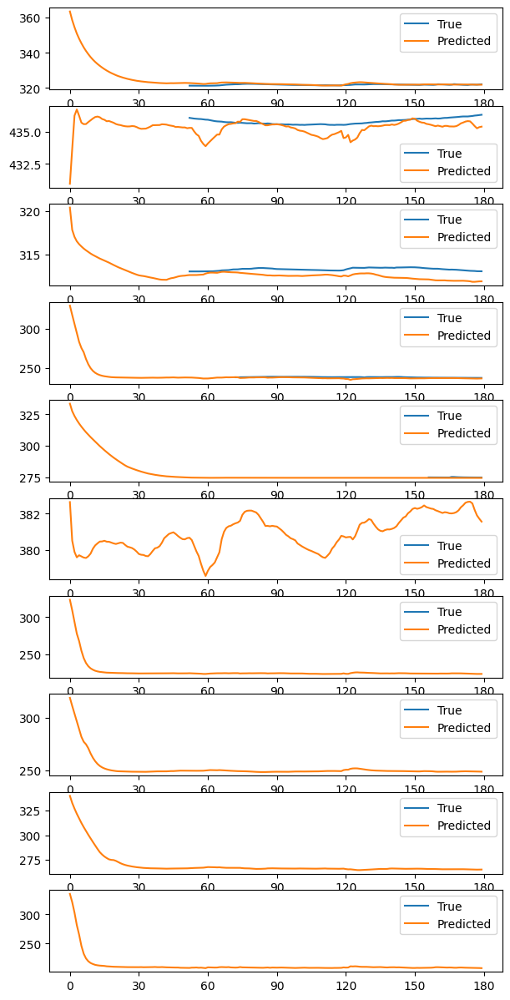

In [17]:
fig, ax = plt.subplots(10, figsize = (7,15))
for i in range(10,20):
        y = y_list[sample_day][i, :].detach().numpy()
        y_idx = np.argwhere(~np.isnan(y))

        ax[i - 10].plot(y_idx, y[y_idx], label = "True")
        ax[i - 10].plot(np.arange(180), y_hat_list[sample_day][i, :].detach().numpy(), label = "Predicted")
        ax[i - 10].set_xticks(np.arange(181, step = 30) )
        ax[i - 10].legend()
        
plt.show()

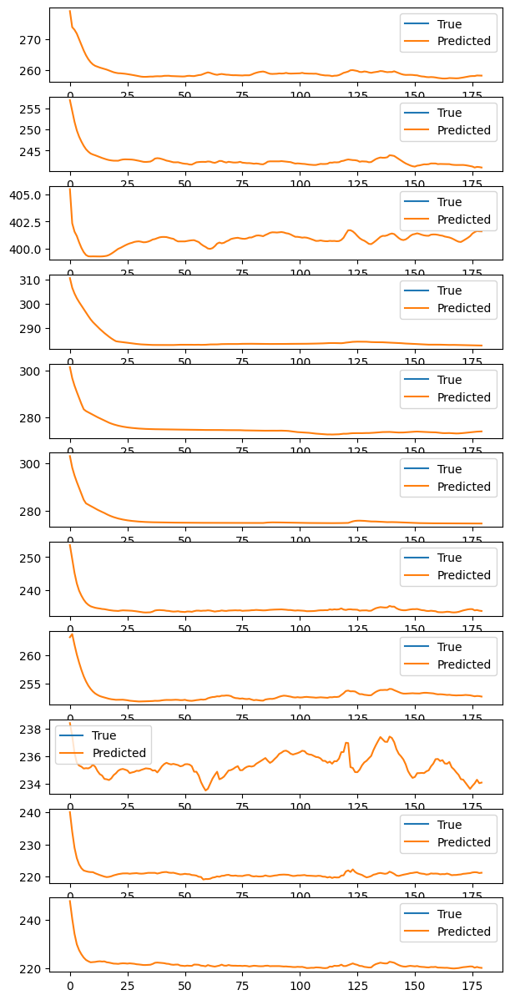

In [23]:
fig, ax = plt.subplots(11, figsize = (7,15))
for i in range(20,31):
        ax[i-20].plot(np.arange(180), y_list[0][(sample_day * 31) + i, :].detach().numpy(), label = "True")
        ax[i-20].plot(np.arange(180), y_hat_list[0][(sample_day * 31) + i, :].detach().numpy(), label = "Predicted")
        ax[i-20].legend()

In [ ]:
MAE = nn.L1Loss()
MSE = nn.MSELoss()

# Compute MAE
output_tensor = MAE(test_prediction, test_target)

# Compute RMSE
RMSE = MSE(test_prediction, test_target)
RMSE = torch.sqrt(RMSE)

print("MAE: ", MAE)
print("RSME: ", RMSE)

# Map predictions

In [12]:
def cpoint_generation(minX, maxX, minY, maxY, dtm,
                      mode = "even",
                      num_lon_point = 100,
                      num_lat_point = 100):
    
    if mode == "even":
        
        # create one-dimensional arrays for x and y
        x = np.linspace(minX, maxX, num_lon_point)
        y = np.linspace(minY, maxY, num_lat_point)[::-1]
        # create the mesh based on these arrays
        X, Y = np.meshgrid(x, y)
        coords = np.stack([Y, X], axis = -1)
        
        
    dtm_xy = dtm.sel(x = x, y = y,
                     method = "nearest").values
    
    coords = np.concat([coords, np.moveaxis(dtm_xy, 0, -1)], axis=-1)
    coords = coords.reshape(coords.shape[0]*coords.shape[1], coords.shape[2])
        
    return coords

In [13]:
sample_date = np.datetime64("2010-06-01")
sample_idx = ds.get_iloc_from_date(date_max = sample_date)

In [15]:
x = ds[sample_idx][0].unsqueeze(0)
z = ds[sample_idx][1].unsqueeze(0)
x_mask = ds[sample_idx][4].unsqueeze(0)

weather_coords = ds.get_weather_coords()
weather_dtm = ds.get_weather_dtm()
weather_coords = torch.cat([weather_coords, weather_dtm], dim = -1)
weather_coords_batch = weather_coords.unsqueeze(0)

w = [ds[sample_idx][2].unsqueeze(0),
     weather_coords_batch]

In [16]:
lon_point = 30
lat_point = int(lon_point * 0.75)
total_cpoint = lat_point * lon_point
x_cpoint = x.expand(total_cpoint,-1,-1)
x_mask_cpoint = x_mask.expand(total_cpoint,-1)
                    
z_cpoint = cpoint_generation(minX = ds.dtm_roi.x.min().values, maxX = ds.dtm_roi.x.max().values,
                                                minY = ds.dtm_roi.y.min().values, maxY = ds.dtm_roi.y.max().values,
                                                dtm = (ds.dtm_roi *ds.norm_factors["dtm_std"]) + ds.norm_factors["dtm_mean"],
                                                num_lon_point = lon_point,
                                                num_lat_point = lat_point)

# normalization 
z_cpoint[:,0] = (z_cpoint[:,0] - ds.norm_factors["lat_mean"])/ds.norm_factors["lat_std"]
z_cpoint[:,1] = (z_cpoint[:,1] - ds.norm_factors["lon_mean"])/ds.norm_factors["lon_std"]
z_cpoint[:,2] = (z_cpoint[:,2] - ds.norm_factors["dtm_mean"].values)/ds.norm_factors["dtm_std"].values
                    
z_cpoint = torch.tensor(z_cpoint).to(torch.float32).to(device)
w_cpoint = [w[0].expand(total_cpoint,-1,-1,-1,-1),
            w[1].expand(total_cpoint,-1,-1,-1)]
                
y_hat_cpoint = model(x_cpoint, z_cpoint, w_cpoint, x_mask_cpoint)

In [17]:
from rasterio.enums import Resampling

dtm_denorm = (ds.dtm_roi *ds.norm_factors["dtm_std"]) + ds.norm_factors["dtm_mean"]

# downscaling dtm
#downscale_factor = 0.05
new_width = lon_point #int(dtm_roi.rio.width * downscale_factor)
new_height = lat_point #int(dtm_roi.rio.height * downscale_factor)

dtm_denorm_downsampled = dtm_denorm.rio.reproject(
    dtm_denorm.rio.crs,
    shape=(new_height, new_width),
    resampling=Resampling.bilinear,
)

In [18]:
# varia prima long (6.7 in senso crescente)
# poi varia lat (in senso crescente)

# primo elemento (alto sx è quindi) 

In [19]:
z_cpoint[:,0] = (z_cpoint[:,0]*ds.norm_factors["lat_std"]) +  ds.norm_factors["lat_mean"]
z_cpoint[:,1] = (z_cpoint[:,1]*ds.norm_factors["lon_std"]) + ds.norm_factors["lon_mean"]

In [20]:
h_pred = y_hat_cpoint.reshape(lat_point,lon_point,180).detach().numpy()
h_pred = (h_pred* ds.norm_factors["target_std"]) + ds.norm_factors["target_mean"]

sample_h = xarray.DataArray(data = h_pred,
                               coords = dict(
                                        lon=("lon", z_cpoint[:,1].unique().detach().numpy()),
                                        lat=("lat", z_cpoint[:,0].unique().detach().numpy()[::-1]),
                                        time=np.arange(180)),
                               dims = ["lat", "lon", "time"]
                               )

wtd_pred = []
for timestep in range(180):
     wtd_pred.append(dtm_denorm_downsampled.values.squeeze() - sample_h[:,:,timestep].values)

wtd_pred = np.stack(wtd_pred, axis = -1)
sample_wtd = xarray.DataArray(data = wtd_pred,
                               coords = dict(
                                        lon=("lon", z_cpoint[:,1].unique().detach().numpy()),
                                        lat=("lat", z_cpoint[:,0].unique().detach().numpy()[::-1]),
                                        time=np.arange(180)),
                               dims = ["lat", "lon", "time"]
                               )

In [21]:
sample_wtd.min()

<xarray.DataArray ()> Size: 8B
array(-63.28211219)

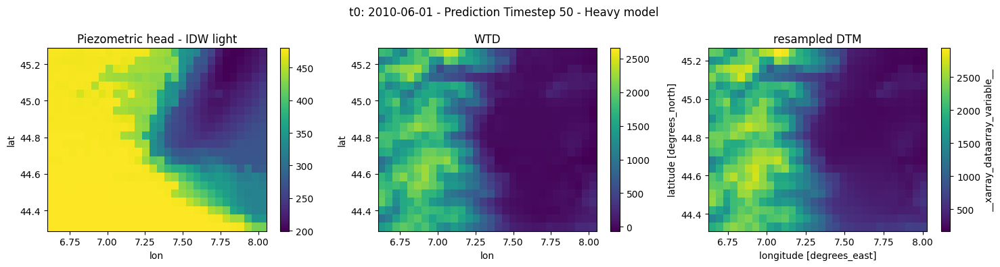

In [31]:
pred_timestep = 50
fig, ax = plt.subplots(1,3, figsize = (15,4))
fig.suptitle(f"t0: {sample_date} - Prediction Timestep {pred_timestep} - Heavy model")

sample_h[:,:,pred_timestep].plot(ax = ax[0])
ax[0].set_title("Piezometric head - IDW light")


sample_wtd[:,:,pred_timestep].plot(ax = ax[1], vmin = sample_wtd.min().values,
                        vmax = sample_wtd.max().values)
ax[1].set_title("WTD")


dtm_denorm_downsampled.plot(ax = ax[2])
ax[2].set_title("resampled DTM")

ax[2].set_ylabel("lat")
ax[2].set_xlabel("lon")


plt.tight_layout()

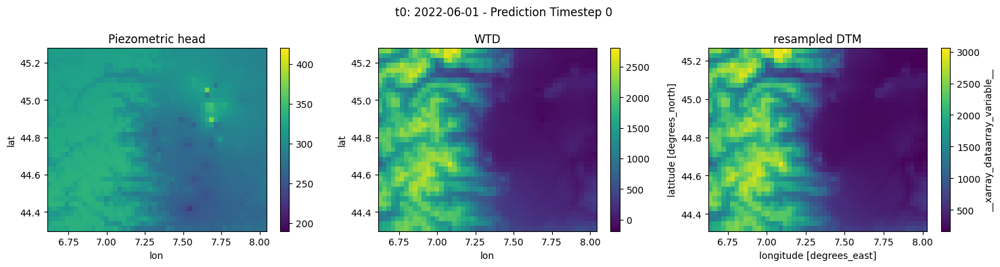

In [45]:
pred_timestep = 0
fig, ax = plt.subplots(1,3, figsize = (15,4))
fig.suptitle(f"t0: {sample_date} - Prediction Timestep {pred_timestep}")

sample_h[:,:,pred_timestep].plot(ax = ax[0], vmin = 190, vmax = 420)
ax[0].set_title("Piezometric head")


sample_wtd[:,:,pred_timestep].plot(ax = ax[1], vmin = sample_wtd.min().values,
                        vmax = sample_wtd.max().values)
ax[1].set_title("WTD")


dtm_denorm_downsampled.plot(ax = ax[2])
ax[2].set_title("resampled DTM")

plt.tight_layout()

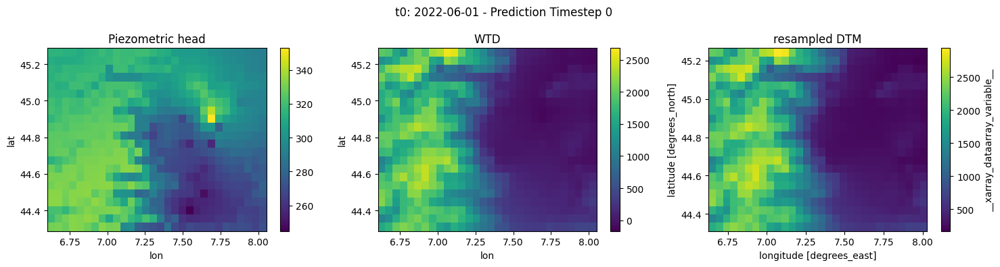

In [27]:
pred_timestep = 0
fig, ax = plt.subplots(1,3, figsize = (15,4))
fig.suptitle(f"t0: {sample_date} - Prediction Timestep {pred_timestep}")

sample_h[:,:,pred_timestep].plot(ax = ax[0])
ax[0].set_title("Piezometric head")


sample_wtd[:,:,pred_timestep].plot(ax = ax[1], vmin = sample_wtd.min().values,
                        vmax = sample_wtd.max().values)
ax[1].set_title("WTD")


dtm_denorm_downsampled.plot(ax = ax[2])
ax[2].set_title("resampled DTM")

plt.tight_layout()

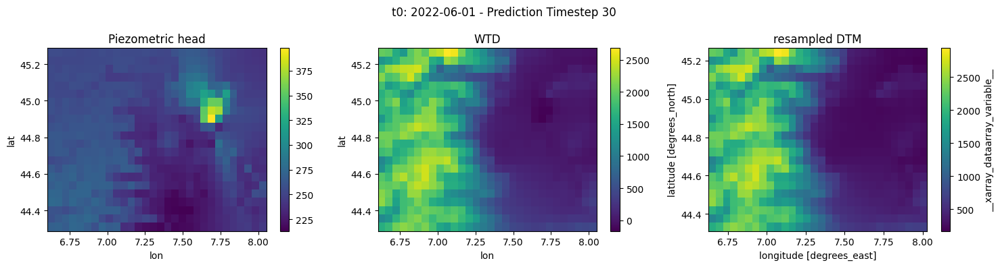

In [28]:
pred_timestep = 30
fig, ax = plt.subplots(1,3, figsize = (15,4))
fig.suptitle(f"t0: {sample_date} - Prediction Timestep {pred_timestep}")

sample_h[:,:,pred_timestep].plot(ax = ax[0])
ax[0].set_title("Piezometric head")


sample_wtd[:,:,pred_timestep].plot(ax = ax[1], vmin = sample_wtd.min().values,
                        vmax = sample_wtd.max().values)
ax[1].set_title("WTD")


dtm_denorm_downsampled.plot(ax = ax[2])
ax[2].set_title("resampled DTM")
plt.tight_layout()

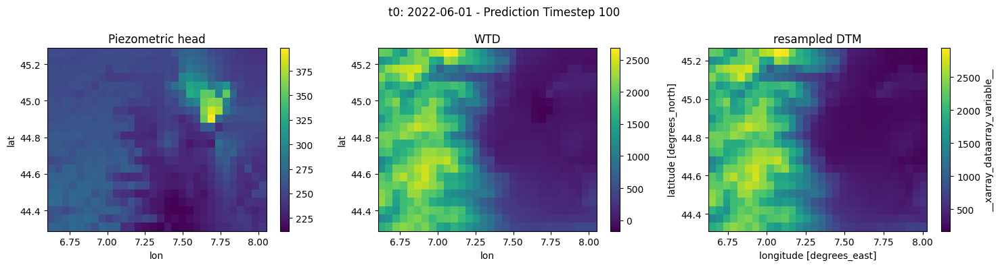

In [29]:
pred_timestep = 100
fig, ax = plt.subplots(1,3, figsize = (15,4))
fig.suptitle(f"t0: {sample_date} - Prediction Timestep {pred_timestep}")

sample_h[:,:,pred_timestep].plot(ax = ax[0])
ax[0].set_title("Piezometric head")


sample_wtd[:,:,pred_timestep].plot(ax = ax[1], vmin = sample_wtd.min().values,
                        vmax = sample_wtd.max().values)
ax[1].set_title("WTD")


dtm_denorm_downsampled.plot(ax = ax[2])
ax[2].set_title("resampled DTM")
plt.tight_layout()

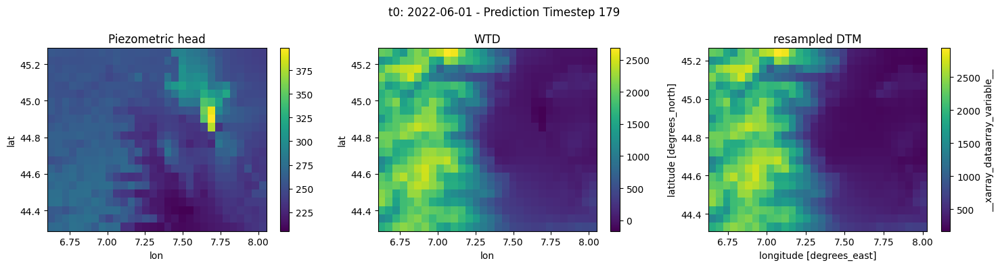

In [30]:
pred_timestep = 179
fig, ax = plt.subplots(1,3, figsize = (15,4))
fig.suptitle(f"t0: {sample_date} - Prediction Timestep {pred_timestep}")

sample_h[:,:,pred_timestep].plot(ax = ax[0])
ax[0].set_title("Piezometric head")


sample_wtd[:,:,pred_timestep].plot(ax = ax[1], vmin = sample_wtd.min().values,
                        vmax = sample_wtd.max().values)
ax[1].set_title("WTD")


dtm_denorm_downsampled.plot(ax = ax[2])
ax[2].set_title("resampled DTM")
plt.tight_layout()

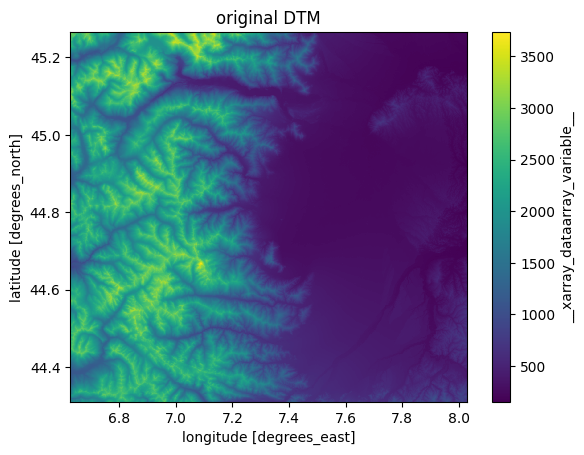

In [166]:
dtm_denorm.plot()
plt.title("original DTM")
plt.show()

In [141]:
sample_pred = sample_h.to_dataset(name = "h")

In [143]:
sample_pred = sample_pred.assign(wtd = sample_wtd)

In [169]:
sample_pred

<xarray.Dataset> Size: 866kB
Dimensions:  (lon: 20, lat: 15, time: 180)
Coordinates:
  * lon      (lon) float32 80B 6.627 6.7 6.774 6.848 ... 7.808 7.882 7.955 8.029
  * lat      (lat) float32 60B 44.31 44.38 44.45 44.52 ... 45.13 45.2 45.26
  * time     (time) int64 1kB 0 1 2 3 4 5 6 7 ... 173 174 175 176 177 178 179
Data variables:
    h        (lat, lon, time) float64 432kB 333.8 326.9 319.0 ... 256.6 256.4
    wtd      (lat, lon, time) float64 432kB -1.678e+03 -1.685e+03 ... -369.1